<a href="https://colab.research.google.com/github/askolesov0608/CV_NV/blob/main/99CVLab4_Tests.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load and setup

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
from google.colab import files

In [3]:
!cp /content/gdrive/MyDrive/CV/Lab4/visualPercepUtils.py /content #copy file

In [4]:
!cp -r /content/gdrive/MyDrive/CV/Lab4/ /content #copy all folder

In [5]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import filters
import glob
import sys
import os

from skimage import feature
from skimage.transform import hough_line, hough_line_peaks  # , probabilistic_hough_line

from scipy import ndimage as ndi
from copy import deepcopy

import glob # Модуль для поиска файлов в директориях с помощью шаблонов в Unix стиле. Например, glob.glob('*.png')
import visualPercepUtils as vpu

In [6]:
#files.upload()

# Code provided from the teacher

## Inputs

In [7]:
#пути к директориям для входных и выходных файлов.
path_input = './Lab4/imgs-P4/'
path_output = './Lab4/imgs-out-P4/'

In [8]:
ls

gdrive/  Lab4/  __pycache__/  sample_data/  visualPercepUtils.py


In [9]:
# Получаем список файлов в директории
files = os.listdir(path_input)

# Выводим список файлов
for file in files:
    print(file)

cuadros.png
lena.pgm


## Start Def testSobel TestCanny TestHough FindPeaks

In [10]:
bLecturerVersion=False
# try:
#     import p4e
#     bLecturerVersion=True
# except ImportError:
#     pass # file only available to lecturers

def testSobel(im, params=None):
    gx = filters.sobel(im, 1)
    return [gx]

def testCanny(im, params=None):
    sigma = params['sigma']
    edge = feature.canny(im, sigma=sigma, low_threshold=0.2 * 255, high_threshold=0.25 * 255, use_quantiles=False)
    return [edge]


def testHough(im, params=None):
    edges = testCanny(im, params)[0]
    numThetas = 200
    H, thetas, rhos = hough_line(edges, np.linspace(-np.pi/2, np.pi/2, numThetas))
    print("# angles:", len(thetas))
    print("# distances:", len(rhos))
    print("rho[...]",rhos[:5],rhos[-5:])
    return [np.log(H+1), (H, thetas, rhos)] # log of Hough space for display purpose


def findPeaks(H, thetas, rhos, nPeaksMax=None):
    if nPeaksMax is None:
        nPeaksMax = np.inf
    return hough_line_peaks(H, thetas, rhos, num_peaks=nPeaksMax, threshold=0.15 * np.max(H), min_angle=20, min_distance=15)

## Test image files

In [11]:
# -----------------
# Test image files
# -----------------
path_input = './Lab4/imgs-P4/'
path_output = './Lab4/imgs-out-P4/'
bAllFiles = True
if bAllFiles:
    files = glob.glob(path_input + "*.p??")
else:
    files = [path_input + 'cuadros.png']  # cuadros, lena

## Tests to perform

In [12]:
# --------------------
# Tests to perform
# --------------------
bAllTests = True
if bAllTests:
    tests = ['testSobel', 'testCanny', 'testHough']
else:
    tests = ['testSobel']
    tests = ['testCanny']
    tests = ['testHough']

## Dictionary of user-friendly names for each function ("test") name

Testing on ['./Lab4/imgs-P4/cuadros.png', './Lab4/imgs-P4/lena.pgm']
testing testSobel on ./Lab4/imgs-P4/cuadros.png
num ouputs 1


<ipython-input-10-2ca6d7160bf4>:9: DeprecationWarning: Please use `sobel` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  gx = filters.sobel(im, 1)


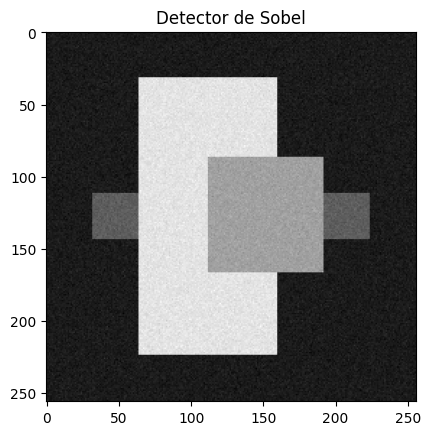

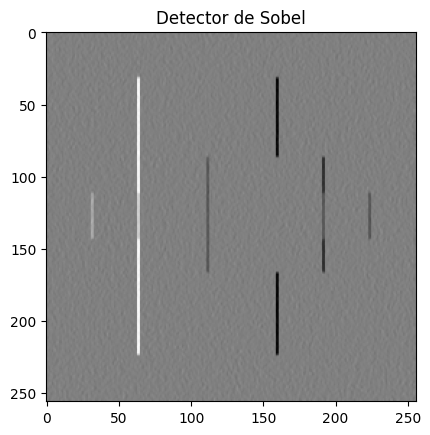

testing testSobel on ./Lab4/imgs-P4/lena.pgm
num ouputs 1


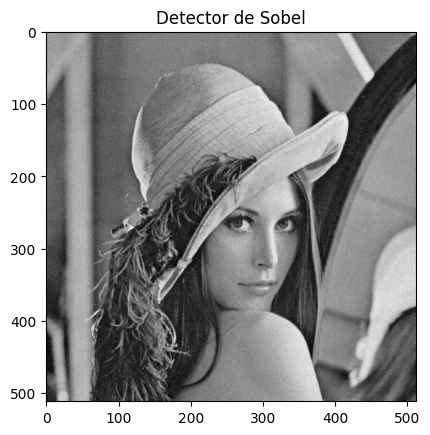

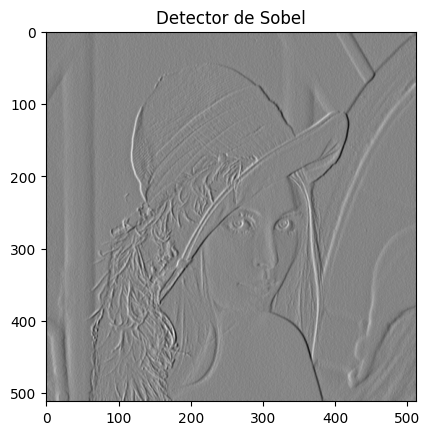

testing testCanny on ./Lab4/imgs-P4/cuadros.png
num ouputs 1


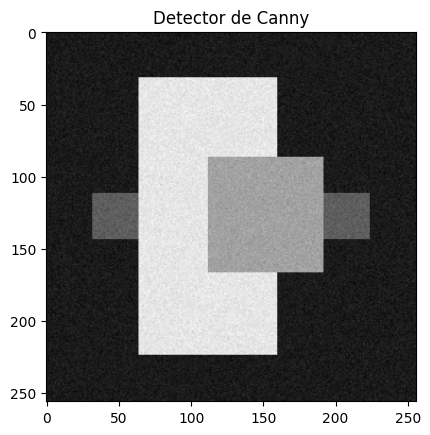

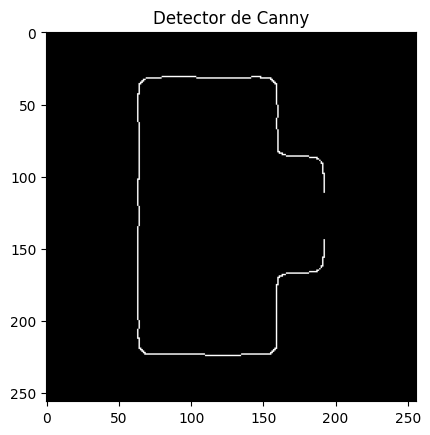

testing testCanny on ./Lab4/imgs-P4/lena.pgm
num ouputs 1


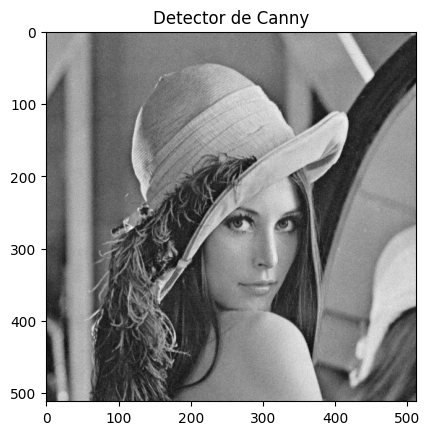

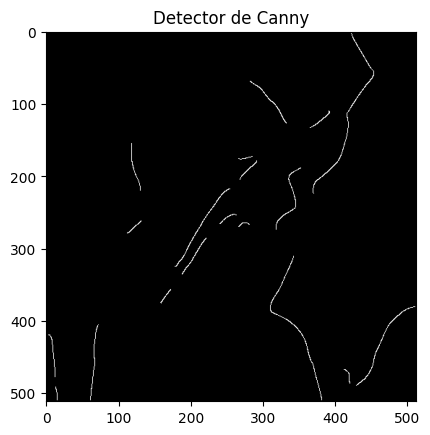

testing testHough on ./Lab4/imgs-P4/cuadros.png
# angles: 200
# distances: 727
rho[...] [-363. -362. -361. -360. -359.] [359. 360. 361. 362. 363.]
num ouputs 2


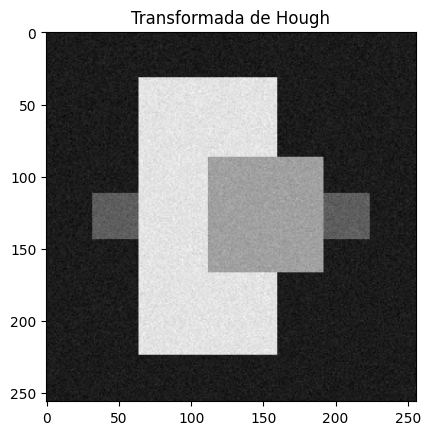

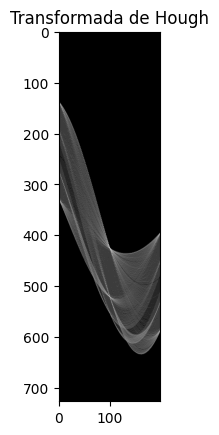

peak 101 at angle 0.4522613065326685 and distance  64.0
peak 67 at angle 90.0 and distance  32.0
peak 66 at angle 89.09547738693469 and distance  225.0
peak 45 at angle -0.4522613065326558 and distance  159.0
peak 25 at angle 0.4522613065326685 and distance  193.0
peak 24 at angle 82.76381909547737 and distance  187.0
peak 22 at angle -88.19095477386935 and distance  -81.0
peak 21 at angle -82.76381909547737 and distance  -64.0


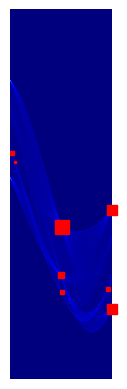

testing testHough on ./Lab4/imgs-P4/lena.pgm
# angles: 200
# distances: 1451
rho[...] [-725. -724. -723. -722. -721.] [721. 722. 723. 724. 725.]
num ouputs 2


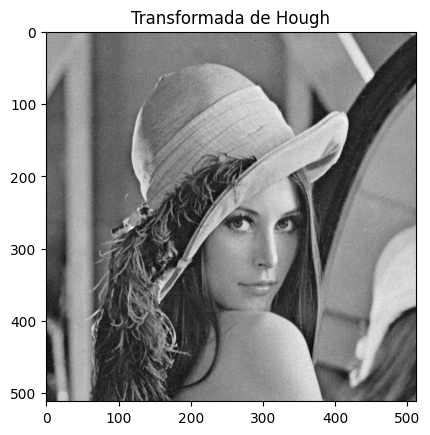

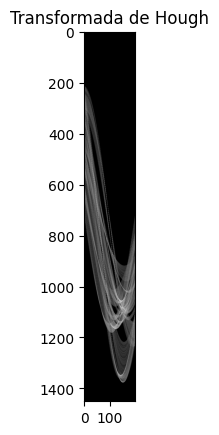

peak 64 at angle 31.206030150753783 and distance  322.0
peak 64 at angle -4.97487437185929 and distance  -29.0
peak 62 at angle 33.01507537688443 and distance  341.0
peak 52 at angle -30.301507537688444 and distance  362.0
peak 52 at angle -15.82914572864322 and distance  228.0
peak 50 at angle -17.63819095477387 and distance  211.0
peak 47 at angle 5.879396984924627 and distance  113.0
peak 46 at angle 32.11055276381909 and distance  413.0
peak 45 at angle 23.065326633165824 and distance  594.0
peak 42 at angle 14.020100502512571 and distance  438.0
peak 40 at angle -41.15577889447236 and distance  171.0
peak 36 at angle -36.63316582914573 and distance  191.0
peak 35 at angle -13.115577889447234 and distance  255.0
peak 33 at angle -45.678391959798994 and distance  149.0
peak 33 at angle -49.2964824120603 and distance  -85.0
peak 31 at angle -46.58291457286432 and distance  -60.0
peak 31 at angle -61.95979899497487 and distance  -196.0
peak 29 at angle 43.86934673366835 and distance  

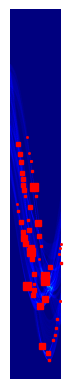

In [13]:
import scipy.ndimage as ndi  # For rotation and other image operations
import imageio

# -------------------------------------------------------------------
# Dictionary of user-friendly names for each function ("test") name
# -------------------------------------------------------------------

nameTests = {'testSobel': 'Detector de Sobel',
             'testCanny': 'Detector de Canny',
             'testHough': 'Transformada de Hough'}

bAddNoise = True
bRotate = False


def doTests():
    print("Testing on", files)
    nFiles = len(files)
    nFig = None
    for test in tests:
        if test == "testSobel":
            params = {}
        elif test in ["testCanny", "testHough"]:
            params = {}
            params['sigma'] = 5  # 15
        if test == "testHough":
            pass  # params={}

        for i, imfile in enumerate(files):
            print("testing", test, "on", imfile)

            im_pil = Image.open(imfile).convert('L')
            im = np.array(im_pil)  # from Image to array

            if bRotate:
                im = ndi.rotate(im, 15, mode='nearest')

            if bAddNoise:
                im = im + np.random.normal(loc=0, scale=5, size=im.shape)

            outs_np = eval(test)(im, params)
            print("num ouputs", len(outs_np))
            if test == "testHough":
                outs_np_plot = outs_np[0:1]
            else:
                outs_np_plot = outs_np
            nFig = vpu.showInFigs([im] + outs_np_plot, title=nameTests[test], nFig=nFig, bDisplay=True)  # bDisplay=True for displaying *now* and waiting for user to close

            if test == "testHough":
                H, thetas, rhos = outs_np[1]  # second output is not directly displayable
                peaks_values, peaks_thetas, peaks_rhos = findPeaks(H, thetas, rhos, nPeaksMax=None)
                vpu.displayHoughPeaks(H, peaks_values, peaks_thetas, peaks_rhos, thetas, rhos)
                if bLecturerVersion:
                    p4e.displayLines(im, peaks_thetas, peaks_rhos, peaks_values) # exercise
                    plt.show(block=True)
                # displayLineSegments(...) # optional exercise

    plt.show(block=True)  # show pending plots (useful if we used bDisplay=False in vpu.showInFigs())


if __name__ == "__main__":
    doTests()


# Testing directory and loads

In [14]:
ls

gdrive/  Lab4/  __pycache__/  sample_data/  visualPercepUtils.py


In [15]:
folder_path = './Lab4/imgs-P4/'
path_output = './Lab4/imgs-out-P4/'


In [16]:
# Получаем список файлов в директории
files = os.listdir(folder_path)

# Выводим список файлов
for file in files:
    print(file)

cuadros.png
lena.pgm


In [17]:
filename = "cuadros.png"

In [18]:
path_input = os.path.join(folder_path, filename)

In [19]:
test_image = Image.open(path_input)
print(test_image.size)

(256, 256)


array([[50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       ...,
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50]], dtype=uint8)
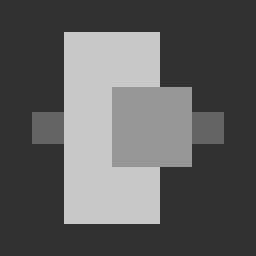

In [20]:
im = np.array(test_image.convert('L'))
im

# 1. Sobel filter

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


<ipython-input-21-fb9e55a56f6c>:1: DeprecationWarning: Please use `sobel` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  asd = filters.sobel(im, axis=1)


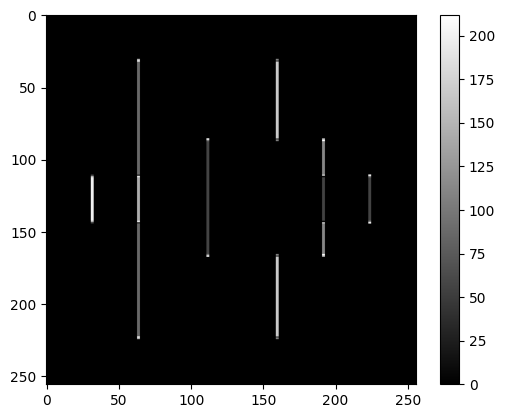

In [21]:
asd = filters.sobel(im, axis=1)

    #axis
    #0 будет вычислен вертикальный градиент (по оси y)
    #1 - горизонтальный градиент (по оси x).

    #mode (опциональный): Определяет способ обработки граничных пикселей.
    #'reflect', 'constant', 'nearest', 'mirror', 'wrap'. По умолчанию используется 'reflect'.
      #mode='reflect' (по умолчанию): Граничные пиксели зеркально отражаются от края изображения. Это означает, что значения пикселей за пределами изображения копируются в отраженном виде, чтобы расширить изображение перед вычислением градиента.
      #mode='constant': Граничные пиксели заполняются постоянным значением, указанным параметром cval.
      #mode='nearest': Граничные пиксели копируются с ближайшего края изображения.
      #mode='mirror': Граничные пиксели отражаются от края изображения, но значение в пикселях отсчитывается от края до центра и обратно (также известно как зеркальное отражение с отсчетом от центра).
      #mode='wrap': Изображение зацикливается, чтобы создать эффект бесконечной поверхности, и граничные пиксели получают значения из противоположного края изображения.

    #cval (опциональный): Значение для заполнения граничных пикселей при использовании режимов 'constant'. По умолчанию равно 0.

    #mask (опциональный): Маска изображения, которая будет учитываться при вычислении градиента.

    #return (опциональный): Определяет, нужно ли возвращать только градиент (True) или также возвращать изображение с обработанными краями (False). По умолчанию значение равно True.

print(asd)
plt.imshow(asd, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

##  Write down the meaning of the gray level associated with the gradient values in the displayed output.

In [22]:
import pandas as pd
from skimage import filters



In [23]:
#ascent = datasets.ascent().astype('int32')
#sobel_h = ndimage.sobel(ascent, 0)  # horizontal gradient
#sobel_v = ndimage.sobel(ascent, 1)  # vertical gradient
#magnitude = np.sqrt(sobel_h**2 + sobel_v**2)
#magnitude *= 255.0 / np.max(magnitude)  # normalization
#fig, axs = plt.subplots(2, 2, figsize=(8, 8))
#plt.gray()  # show the filtered result in grayscale
#axs[0, 0].imshow(ascent)
#axs[0, 1].imshow(sobel_h)
#axs[1, 0].imshow(sobel_v)
#axs[1, 1].imshow(magnitude)
#titles = ["original", "horizontal", "vertical", "magnitude"]
#for i, ax in enumerate(axs.ravel()):
#    ax.set_title(titles[i])
#    ax.axis("off")
#plt.show()

Code From Big Data Analytics

In [24]:
# Преобразуем массив изображения в одномерный массив
asd_flat = asd.flatten()

# Получаем уникальные значения уровня серого
gray_levels = np.unique(asd_flat)

# Вычисляем количество пикселей для каждого уровня серого
pixel_counts = [np.sum(asd_flat == level) for level in gray_levels]

# Создаем DataFrame с данными
data = {"Gray level": gray_levels, "Pixel Vol": pixel_counts}
df = pd.DataFrame(data)

# Выводим таблицу
print(df)

    Gray level  Pixel Vol
0            0      64452
1            6          4
2           38          4
3           50          4
4           56        276
5           62          8
6           88        312
7          106         16
8          112         88
9          144         60
10         150          8
11         156          4
12         162          4
13         168        216
14         194          8
15         200         60
16         206          8
17         212          4


## Modify testSobel() to compute the gradient Horizontal

[[-6.9388939e-18 -6.9388939e-18 -6.9388939e-18 ... -6.9388939e-18
  -6.9388939e-18 -6.9388939e-18]
 [-6.9388939e-18 -6.9388939e-18 -6.9388939e-18 ... -6.9388939e-18
  -6.9388939e-18 -6.9388939e-18]
 [-6.9388939e-18 -6.9388939e-18 -6.9388939e-18 ... -6.9388939e-18
  -6.9388939e-18 -6.9388939e-18]
 ...
 [-6.9388939e-18 -6.9388939e-18 -6.9388939e-18 ... -6.9388939e-18
  -6.9388939e-18 -6.9388939e-18]
 [-6.9388939e-18 -6.9388939e-18 -6.9388939e-18 ... -6.9388939e-18
  -6.9388939e-18 -6.9388939e-18]
 [-6.9388939e-18 -6.9388939e-18 -6.9388939e-18 ... -6.9388939e-18
  -6.9388939e-18 -6.9388939e-18]]


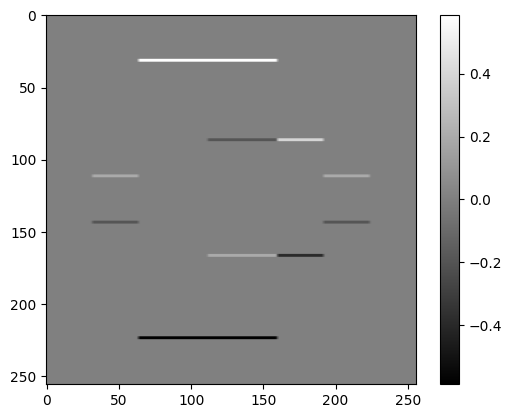

In [25]:
asdk = filters.sobel(im, axis=0)
print(asdk)
plt.imshow(asdk, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

## other direction and return the magnitude of the gradient.

[[4.90653893e-18 4.90653893e-18 4.90653893e-18 ... 4.90653893e-18
  4.90653893e-18 4.90653893e-18]
 [4.90653893e-18 4.90653893e-18 4.90653893e-18 ... 4.90653893e-18
  4.90653893e-18 4.90653893e-18]
 [4.90653893e-18 4.90653893e-18 4.90653893e-18 ... 4.90653893e-18
  4.90653893e-18 4.90653893e-18]
 ...
 [4.90653893e-18 4.90653893e-18 4.90653893e-18 ... 4.90653893e-18
  4.90653893e-18 4.90653893e-18]
 [4.90653893e-18 4.90653893e-18 4.90653893e-18 ... 4.90653893e-18
  4.90653893e-18 4.90653893e-18]
 [4.90653893e-18 4.90653893e-18 4.90653893e-18 ... 4.90653893e-18
  4.90653893e-18 4.90653893e-18]]


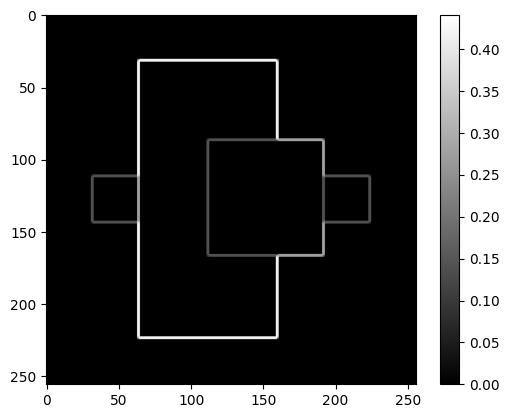

In [26]:
asdkl = filters.sobel(im)
print(asdkl)
plt.imshow(asdkl, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

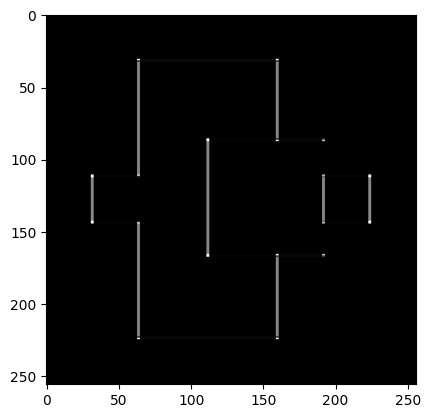

In [27]:
magnitude = np.sqrt(asd**2 + asdk**2)
magnitude_norm = magnitude * (255.0 / np.max(magnitude))  # normalization
plt.imshow(magnitude_norm, cmap="gray")

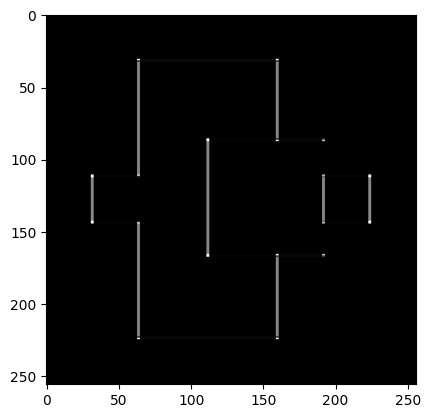

In [28]:
magnitude_bin = magnitude*(1.0 / np.max(magnitude))  # Bin
plt.imshow(magnitude_bin, cmap="gray")


In [29]:
magnitude_flat = magnitude.flatten()

# Получаем уникальные значения уровня серого
gray_levels = np.unique(magnitude_flat)

# Вычисляем количество пикселей для каждого уровня серого
pixel_counts = [np.sum(magnitude_flat == level) for level in gray_levels]

# Создаем DataFrame с данными
data = {"Gray level": gray_levels, "Pixel Vol": pixel_counts}
df = pd.DataFrame(data)

# Выводим таблицу
print(df)

      Gray level  Pixel Vol
0   6.938894e-18      41812
1   1.387779e-17       1800
2   2.775558e-17      20038
3   5.551115e-17         30
4   1.960784e-01        184
5   1.960784e-01        120
6   1.960784e-01        120
7   3.921569e-01         60
8   3.921569e-01         60
9   5.882353e-01        188
10  5.882353e-01        188
11  2.000601e+00          4
12  2.005399e+00          6
13  2.014962e+00          2
14  2.048081e+00          4
15  4.001201e+00          2
16  4.010799e+00          2
17  6.000200e+00          2
18  6.001802e+00          2
19  8.000000e+00        864
20  1.148923e+01          2
21  1.149007e+01          2
22  1.200040e+01          2
23  1.200360e+01          2
24  1.280634e+01          2
25  1.280709e+01          2
26  1.400009e+01          6
27  1.400077e+01          6
28  1.509975e+01          8
29  1.510038e+01         10
30  1.510166e+01          2
31  1.510611e+01          4



threshold = 0.1 - это значение порога, которое используется для бинаризации амплитуды градиента.

После вычисления амплитуды градиента с помощью оператора Собеля, каждый пиксель в изображении имеет значение, которое показывает степень изменения яркости в этой точке. Затем пороговая фильтрация применяется к этим значениям: если значение амплитуды градиента в пикселе превышает пороговое значение, этот пиксель считается частью края, и его значение в бинарной карте устанавливается в 1 (или True); в противном случае он считается не краем и его значение в бинарной карте устанавливается в 0 (или False).

Значение порога (в данном случае 0.1) определяет, какие пиксели будут считаться частью края и какие - нет. Значение порога следует выбирать экспериментально в зависимости от характеристик изображения и требуемого уровня детализации краев. Увеличение значения порога делает карту краев менее детализированной, а уменьшение - более детализированной.

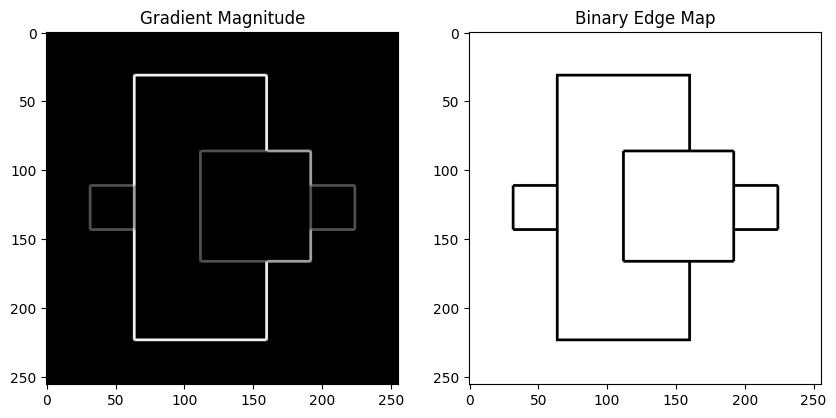

In [132]:
#OR
# Задаем порог для бинаризации
threshold = 0.15  # Пример значения порога, которое нужно настроить изображение
binary_edge_map = magnitude > threshold
# Визуализируем результат
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
ax = axes.ravel()
ax[0].imshow(magnitude, cmap='gray')
ax[0].set_title('Gradient Magnitude')
ax[1].imshow(binary_edge_map, cmap='binary')
ax[1].set_title('Binary Edge Map')
plt.show()

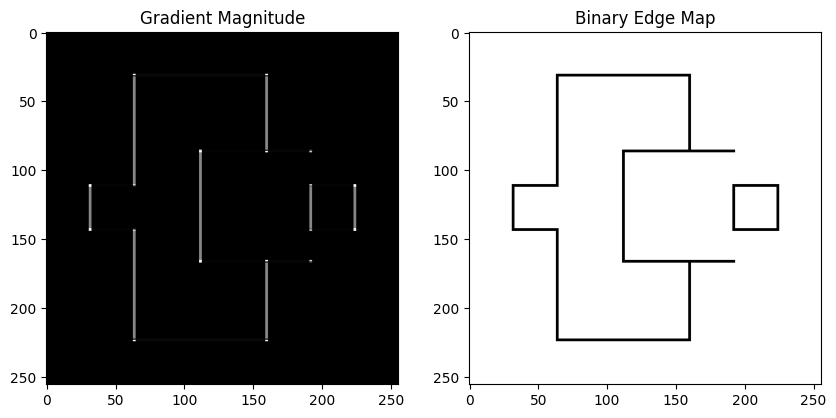

In [31]:

#OR
# Задаем порог для бинаризации
threshold = 0.001  # Пример значения порога, которое нужно настроить изображение
binary_edge_map = magnitude_bin > threshold
# Визуализируем результат
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
ax = axes.ravel()
ax[0].imshow(magnitude_bin, cmap='gray')
ax[0].set_title('Gradient Magnitude')
ax[1].imshow(binary_edge_map, cmap='binary')
ax[1].set_title('Binary Edge Map')
plt.show()

## Use the bAddNois

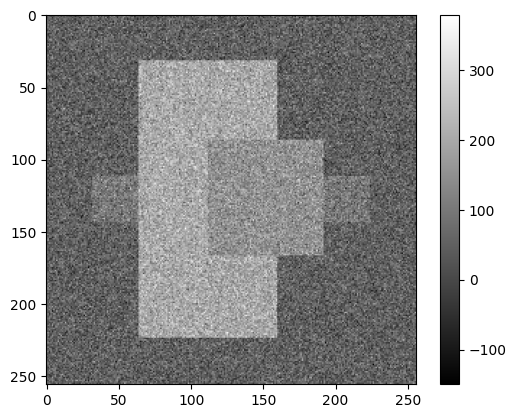

In [32]:
im_n = im + np.random.normal(loc=0, scale=50, size=im.shape)
plt.imshow(im_n, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

[[27.73377856 53.62389363 47.92553531 ... 51.32547799 81.06188996
  82.72684575]
 [34.03725073 59.76140235 29.92710562 ... 78.26539501 87.77587316
  53.45719864]
 [53.98761853 54.70146522 13.01910239 ... 25.99333976 78.84003933
  37.19184353]
 ...
 [20.98728791 21.44189256 30.19972246 ... 85.42043399 79.05326513
  45.90533076]
 [30.50786157 36.33171266 23.31050428 ... 76.45510653 51.08802795
  51.88917359]
 [16.15358963 33.20568476 43.80644845 ... 73.37290101 52.14059354
  96.15161406]]


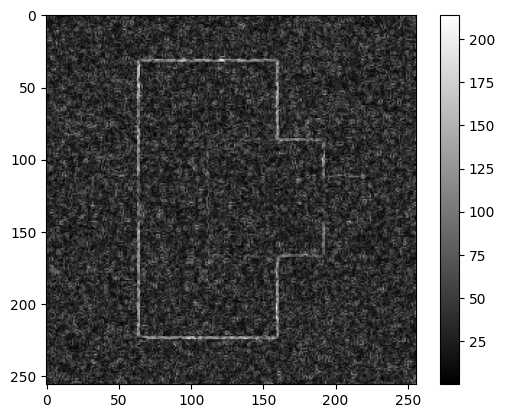

In [33]:
asdkl = filters.sobel(im_n)
print(asdkl)
plt.imshow(asdkl, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

# 1. Sobel filter Lena

(512, 512)


array([[165, 165, 165, ..., 172, 158, 132],
       [165, 165, 165, ..., 172, 158, 132],
       [165, 165, 165, ..., 172, 158, 132],
       ...,
       [ 47,  47,  54, ..., 109, 105, 104],
       [ 48,  48,  58, ..., 108, 110, 113],
       [ 48,  48,  58, ..., 108, 110, 113]], dtype=uint8)
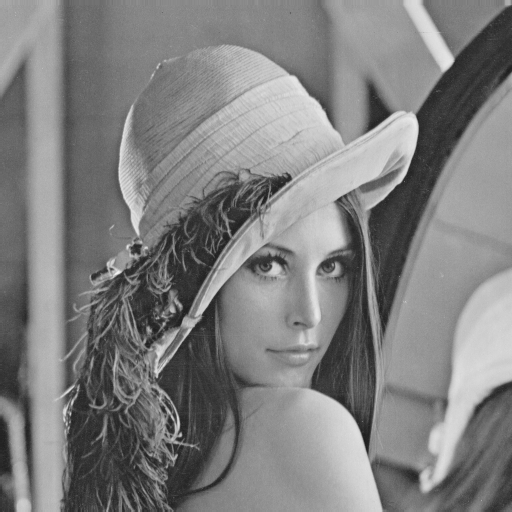

In [34]:
filename = "lena.pgm"
path_input = os.path.join(folder_path, filename)
test_image = Image.open(path_input)
print(test_image.size)
im = np.array(test_image.convert('L'))
im


[[ 0.          0.         -0.00392157 ... -0.0627451  -0.15686275
  -0.10196078]
 [ 0.          0.         -0.00392157 ... -0.0627451  -0.15686275
  -0.10196078]
 [ 0.          0.         -0.00392157 ... -0.0627451  -0.15686275
  -0.10196078]
 ...
 [ 0.          0.02647059  0.01862745 ...  0.00196078 -0.01078431
   0.        ]
 [ 0.          0.03627451  0.04411765 ...  0.01470588  0.00980392
   0.00784314]
 [ 0.          0.03921569  0.08627451 ...  0.01960784  0.01960784
   0.01176471]]


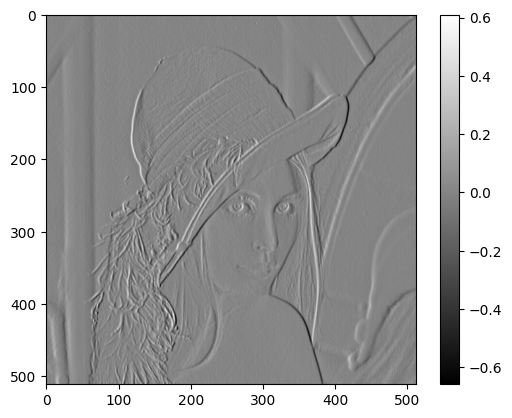

In [35]:
asd = filters.sobel(im, axis=1)

    #axis
    #0 будет вычислен вертикальный градиент (по оси y)
    #1 - горизонтальный градиент (по оси x).

    #mode (опциональный): Определяет способ обработки граничных пикселей.
    #'reflect', 'constant', 'nearest', 'mirror', 'wrap'. По умолчанию используется 'reflect'.
      #mode='reflect' (по умолчанию): Граничные пиксели зеркально отражаются от края изображения. Это означает, что значения пикселей за пределами изображения копируются в отраженном виде, чтобы расширить изображение перед вычислением градиента.
      #mode='constant': Граничные пиксели заполняются постоянным значением, указанным параметром cval.
      #mode='nearest': Граничные пиксели копируются с ближайшего края изображения.
      #mode='mirror': Граничные пиксели отражаются от края изображения, но значение в пикселях отсчитывается от края до центра и обратно (также известно как зеркальное отражение с отсчетом от центра).
      #mode='wrap': Изображение зацикливается, чтобы создать эффект бесконечной поверхности, и граничные пиксели получают значения из противоположного края изображения.

    #cval (опциональный): Значение для заполнения граничных пикселей при использовании режимов 'constant'. По умолчанию равно 0.

    #mask (опциональный): Маска изображения, которая будет учитываться при вычислении градиента.

    #return (опциональный): Определяет, нужно ли возвращать только градиент (True) или также возвращать изображение с обработанными краями (False). По умолчанию значение равно True.

print(asd)
plt.imshow(asd, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

##  Write down the meaning of the gray level associated with the gradient values in the displayed output.

In [36]:
import pandas as pd
from skimage import filters



In [37]:
#ascent = datasets.ascent().astype('int32')
#sobel_h = ndimage.sobel(ascent, 0)  # horizontal gradient
#sobel_v = ndimage.sobel(ascent, 1)  # vertical gradient
#magnitude = np.sqrt(sobel_h**2 + sobel_v**2)
#magnitude *= 255.0 / np.max(magnitude)  # normalization
#fig, axs = plt.subplots(2, 2, figsize=(8, 8))
#plt.gray()  # show the filtered result in grayscale
#axs[0, 0].imshow(ascent)
#axs[0, 1].imshow(sobel_h)
#axs[1, 0].imshow(sobel_v)
#axs[1, 1].imshow(magnitude)
#titles = ["original", "horizontal", "vertical", "magnitude"]
#for i, ax in enumerate(axs.ravel()):
#    ax.set_title(titles[i])
#    ax.axis("off")
#plt.show()

Code From Big Data Analytics

In [38]:
# Преобразуем массив изображения в одномерный массив
asd_flat = asd.flatten()

# Получаем уникальные значения уровня серого
gray_levels = np.unique(asd_flat)

# Вычисляем количество пикселей для каждого уровня серого
pixel_counts = [np.sum(asd_flat == level) for level in gray_levels]

# Создаем DataFrame с данными
data = {"Gray level": gray_levels, "Pixel Vol": pixel_counts}
df = pd.DataFrame(data)

# Выводим таблицу
print(df)

      Gray level  Pixel Vol
0      -0.657843          1
1      -0.656863          1
2      -0.653922          1
3      -0.650980          1
4      -0.650980          1
...          ...        ...
5988    0.526471          1
5989    0.536275          1
5990    0.565686          1
5991    0.600000          1
5992    0.609804          1

[5993 rows x 2 columns]


## Modify testSobel() to compute the gradient Horizontal

[[-2.77555756e-17 -2.77555756e-17 -5.55111512e-17 ...  5.55111512e-17
  -5.55111512e-17  0.00000000e+00]
 [-2.77555756e-17 -2.77555756e-17 -5.55111512e-17 ...  5.55111512e-17
  -5.55111512e-17  0.00000000e+00]
 [-2.77555756e-17 -2.77555756e-17 -5.55111512e-17 ...  5.55111512e-17
  -5.55111512e-17  0.00000000e+00]
 ...
 [-7.84313725e-03 -9.80392157e-04  8.82352941e-03 ...  9.80392157e-03
   2.84313725e-02  4.31372549e-02]
 [ 3.92156863e-03  6.86274510e-03  3.23529412e-02 ...  2.94117647e-03
   1.76470588e-02  3.13725490e-02]
 [ 0.00000000e+00  6.93889390e-18  1.96078431e-02 ...  2.77555756e-17
   0.00000000e+00  0.00000000e+00]]


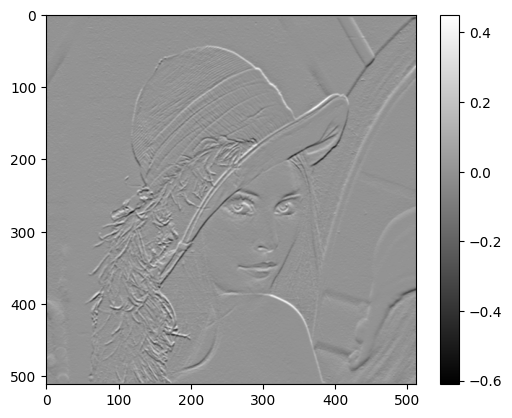

In [39]:
asdk = filters.sobel(im, axis=0)
print(asdk)
plt.imshow(asdk, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

## other direction and return the magnitude of the gradient.

[[1.96261557e-17 1.96261557e-17 2.77296777e-03 ... 4.43674843e-02
  1.10918711e-01 7.20971620e-02]
 [1.96261557e-17 1.96261557e-17 2.77296777e-03 ... 4.43674843e-02
  1.10918711e-01 7.20971620e-02]
 [1.96261557e-17 1.96261557e-17 2.77296777e-03 ... 4.43674843e-02
  1.10918711e-01 7.20971620e-02]
 ...
 [5.54593554e-03 1.87303659e-02 1.45745772e-02 ... 7.06970838e-03
  2.15016786e-02 3.05026455e-02]
 [2.77296777e-03 2.61049548e-02 3.86851366e-02 ... 1.06045626e-02
  1.42747253e-02 2.28664780e-02]
 [0.00000000e+00 2.77296777e-02 6.25610044e-02 ... 1.38648388e-02
  1.38648388e-02 8.31890331e-03]]


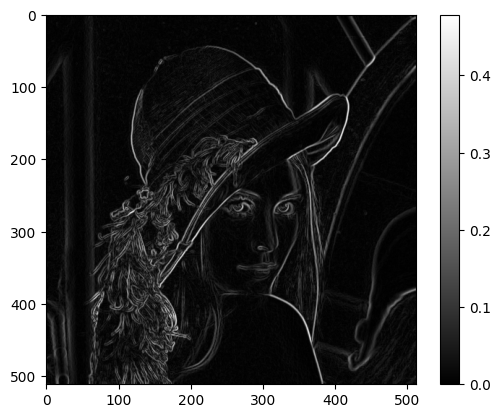

In [40]:
asdkl = filters.sobel(im)
print(asdkl)
plt.imshow(asdkl, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

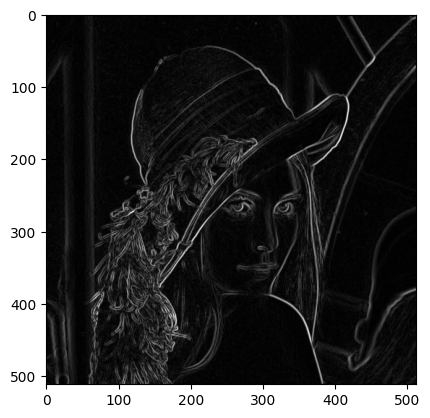

In [41]:
magnitude = np.sqrt(asd**2 + asdk**2)
magnitude_norm = magnitude * (255.0 / np.max(magnitude))  # normalization
plt.imshow(magnitude_norm, cmap="gray")

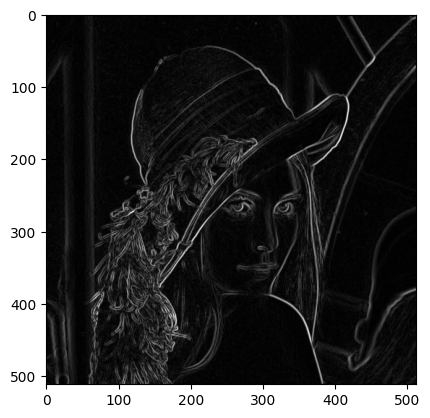

In [42]:
magnitude_bin = magnitude*(1.0 / np.max(magnitude))  # Bin
plt.imshow(magnitude_bin, cmap="gray")


In [43]:
magnitude_flat = magnitude.flatten()

# Получаем уникальные значения уровня серого
gray_levels = np.unique(magnitude_flat)

# Вычисляем количество пикселей для каждого уровня серого
pixel_counts = [np.sum(magnitude_flat == level) for level in gray_levels]

# Создаем DataFrame с данными
data = {"Gray level": gray_levels, "Pixel Vol": pixel_counts}
df = pd.DataFrame(data)

# Выводим таблицу
print(df)

         Gray level  Pixel Vol
0      0.000000e+00        176
1      6.938894e-18          6
2      9.813078e-18          5
3      1.387779e-17         39
4      1.551584e-17          4
...             ...        ...
45119  6.635741e-01          1
45120  6.672791e-01          1
45121  6.700390e-01          1
45122  6.719542e-01          1
45123  6.771097e-01          1

[45124 rows x 2 columns]



threshold = 0.1 - это значение порога, которое используется для бинаризации амплитуды градиента.

После вычисления амплитуды градиента с помощью оператора Собеля, каждый пиксель в изображении имеет значение, которое показывает степень изменения яркости в этой точке. Затем пороговая фильтрация применяется к этим значениям: если значение амплитуды градиента в пикселе превышает пороговое значение, этот пиксель считается частью края, и его значение в бинарной карте устанавливается в 1 (или True); в противном случае он считается не краем и его значение в бинарной карте устанавливается в 0 (или False).

Значение порога (в данном случае 0.1) определяет, какие пиксели будут считаться частью края и какие - нет. Значение порога следует выбирать экспериментально в зависимости от характеристик изображения и требуемого уровня детализации краев. Увеличение значения порога делает карту краев менее детализированной, а уменьшение - более детализированной.

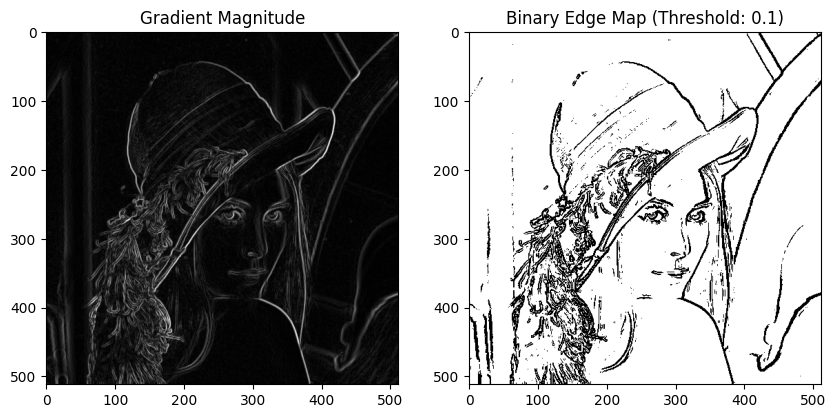

In [44]:
#OR
# Задаем порог для бинаризации
threshold = 0.1  # Пример значения порога, которое нужно настроить под ваше изображение
binary_edge_map = magnitude > threshold
# Визуализируем результат
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
ax = axes.ravel()
ax[0].imshow(magnitude, cmap='gray')
ax[0].set_title('Gradient Magnitude')
ax[1].imshow(binary_edge_map, cmap='binary')
ax[1].set_title(f'Binary Edge Map (Threshold: {threshold})')
plt.show()

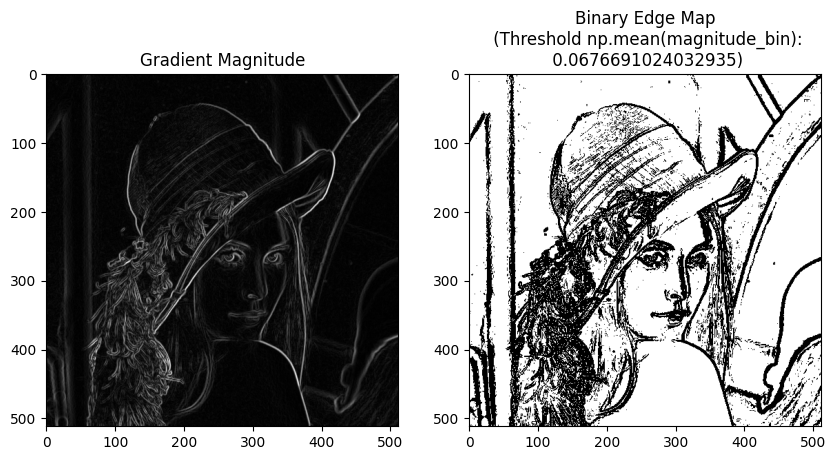

In [45]:

#OR
# Задаем порог для бинаризации
threshold = np.mean(magnitude_bin)
#threshold = 0.18  # Пример значения порога, которое нужно настроить под ваше изображение
binary_edge_map = magnitude_bin > threshold
# Визуализируем результат
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
ax = axes.ravel()
ax[0].imshow(magnitude_bin, cmap='gray')
ax[0].set_title('Gradient Magnitude')
ax[1].imshow(binary_edge_map, cmap='binary')
ax[1].set_title(f'Binary Edge Map\n (Threshold np.mean(magnitude_bin):\n {threshold})')
plt.show()

## Use the bAddNois

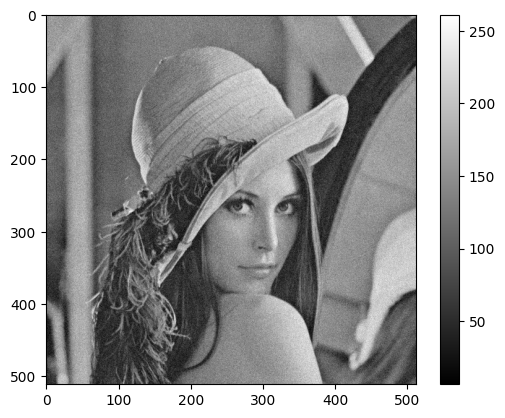

In [46]:
im_n = im + np.random.normal(loc=0, scale=10, size=im.shape)
plt.imshow(im_n, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

[[15.64561023  9.74285318  4.56514277 ...  3.41903457 29.98263044
  13.78672064]
 [ 3.99251056  4.70195932  4.00930355 ...  7.04208769 28.02339108
  18.57694301]
 [12.74241808  9.47129375 12.91158106 ... 11.25172658 27.44481746
  21.30877157]
 ...
 [13.27172156  9.34042822  4.61950425 ...  2.48532417  7.83924165
  11.80269551]
 [14.97640067 14.84911131  7.65015982 ...  2.35853884  7.03813338
   1.58111636]
 [21.01757353 24.31629499 11.44796784 ...  9.05582772  5.28585015
   6.75474238]]


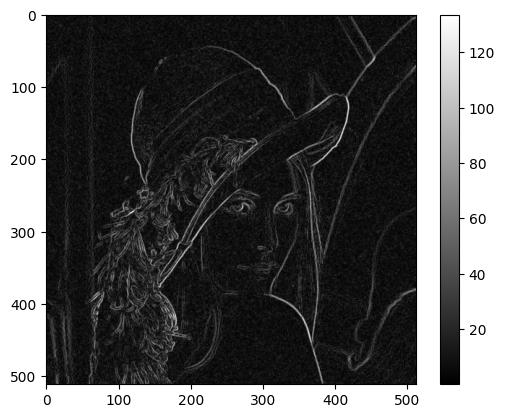

In [47]:
asdkl = filters.sobel(im_n)
print(asdkl)
plt.imshow(asdkl, cmap="gray")
plt.colorbar()  # Добавляем цветовую шкалу
plt.show()

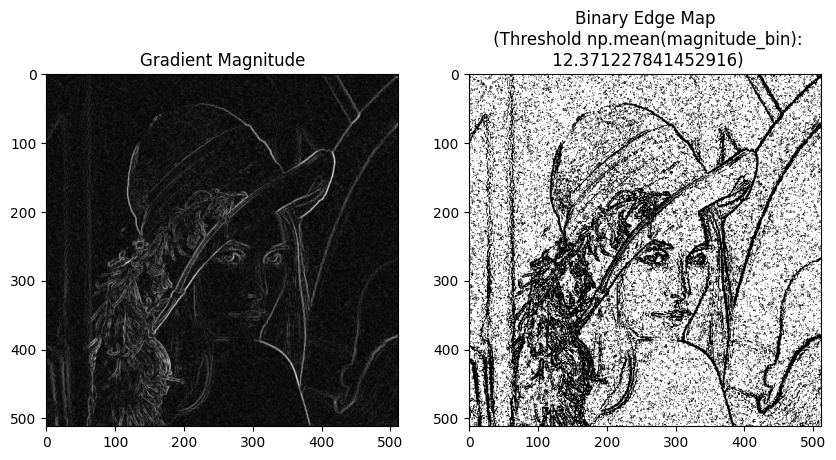

In [48]:
#OR
# Задаем порог для бинаризации
threshold = np.mean(asdkl)
#threshold = 20 # Пример значения порога, которое нужно настроить под ваше изображение
binary_edge_map = asdkl > threshold
# Визуализируем результат
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
ax = axes.ravel()
ax[0].imshow(asdkl, cmap='gray')
ax[0].set_title('Gradient Magnitude')
ax[1].imshow(binary_edge_map, cmap='binary')
ax[1].set_title(f'Binary Edge Map\n (Threshold np.mean(magnitude_bin):\n {threshold})')
plt.show()

# 2. Detector de Canny


## Load Images im = cuadros im2 = Lena

(256, 256)


array([[50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       ...,
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50]], dtype=uint8)
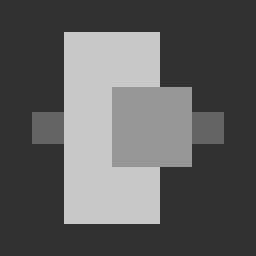

In [49]:
filename = "cuadros.png"
path_input = os.path.join(folder_path, filename)
test_image_1 = Image.open(path_input)
print(test_image_1.size)
im1 = np.array(test_image_1.convert('L'))
im1

(512, 512)


array([[165, 165, 165, ..., 172, 158, 132],
       [165, 165, 165, ..., 172, 158, 132],
       [165, 165, 165, ..., 172, 158, 132],
       ...,
       [ 47,  47,  54, ..., 109, 105, 104],
       [ 48,  48,  58, ..., 108, 110, 113],
       [ 48,  48,  58, ..., 108, 110, 113]], dtype=uint8)
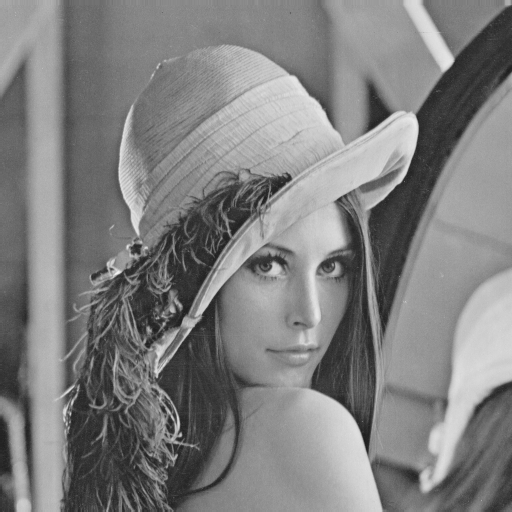

In [50]:
filename = "lena.pgm"
path_input = os.path.join(folder_path, filename)
test_image_2 = Image.open(path_input)
print(test_image_2.size)
im2 = np.array(test_image_2.convert('L'))
im2

## Test Code from https://scikit-image.org/docs/dev/auto_examples/edges/plot_canny.html

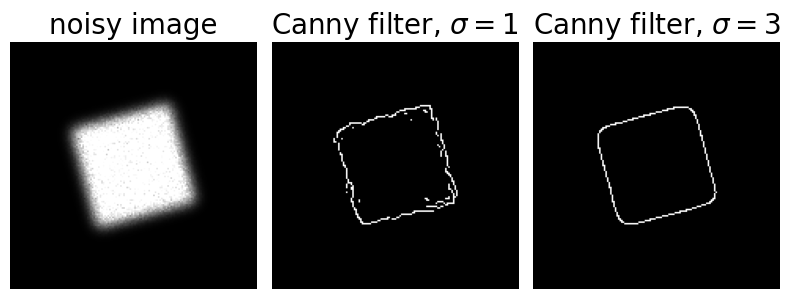

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.util import random_noise
from skimage import feature


# Generate noisy image of a square
image = np.zeros((128, 128), dtype=float)
image[32:-32, 32:-32] = 1

image = ndi.rotate(image, 15, mode='constant')
image = ndi.gaussian_filter(image, 4)
image = random_noise(image, mode='speckle', mean=0.1)

# Compute the Canny filter for two values of sigma
edges1 = feature.canny(image)
edges2 = feature.canny(image, sigma=3)

# display results
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8, 3))

ax[0].imshow(image, cmap='gray')
ax[0].set_title('noisy image', fontsize=20)

ax[1].imshow(edges1, cmap='gray')
ax[1].set_title(r'Canny filter, $\sigma=1$', fontsize=20)

ax[2].imshow(edges2, cmap='gray')
ax[2].set_title(r'Canny filter, $\sigma=3$', fontsize=20)

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

## Code Canny

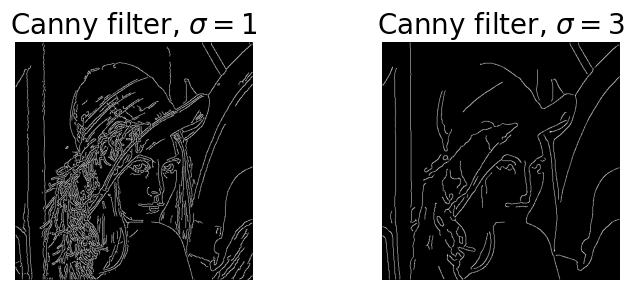

In [52]:
# Compute the Canny filter for two values of sigma
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=3)

# display results
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))

ax[0].imshow(edges1, cmap='gray')
ax[0].set_title(r'Canny filter, $\sigma=1$', fontsize=20)

ax[1].imshow(edges2, cmap='gray')
ax[1].set_title(r'Canny filter, $\sigma=3$', fontsize=20)

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

## Code Lena 1 Sobel - 2 Canny

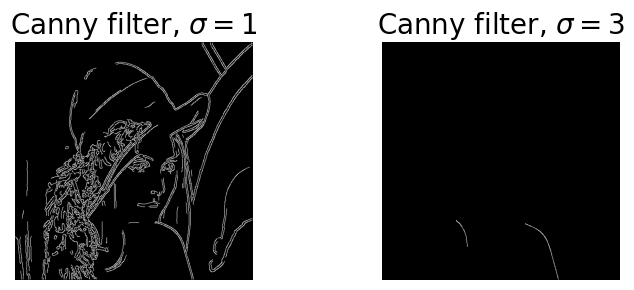

In [53]:
LenaSobel = filters.sobel(im2)

#threshold = np.mean(magnitude_bin)
#threshold = 0.9  # Пример значения порога, которое нужно настроить под ваше изображени
#binary_edge_map = asdkl > threshold

#edges = cv2.Canny(blurred, lower_threshold, upper_threshold)
edges1 = feature.canny(LenaSobel)
edges2 = feature.canny(LenaSobel, sigma=3)


# display results
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))

ax[0].imshow(edges1, cmap='gray')
ax[0].set_title(r'Canny filter, $\sigma=1$', fontsize=20)

ax[1].imshow(edges2, cmap='gray')
ax[1].set_title(r'Canny filter, $\sigma=3$', fontsize=20)

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()


## Code Lena 1 Canny - 2 Sobel

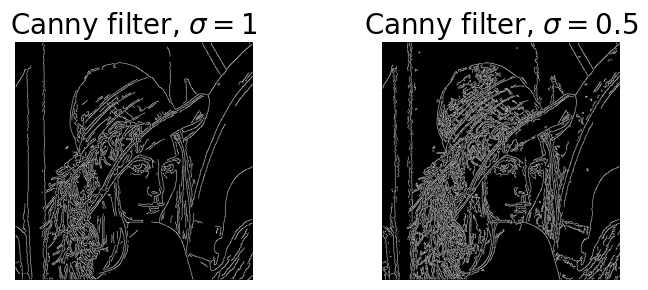

In [54]:
edges1 = feature.canny(im2)
edges2 = feature.canny(im2, sigma=0.5)

# display results
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 3))

ax[0].imshow(edges1, cmap='gray')
ax[0].set_title(r'Canny filter, $\sigma=1$', fontsize=20)

ax[1].imshow(edges2, cmap='gray')
ax[1].set_title(r'Canny filter, $\sigma=0.5$', fontsize=20)

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

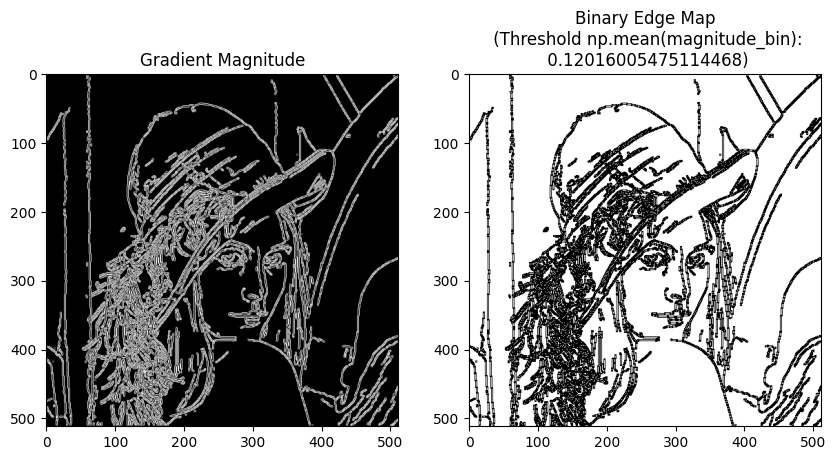

In [55]:
asdkl = filters.sobel(edges1)
threshold = np.mean(asdkl)
#threshold = 0.001 # Пример значения порога, которое нужно настроить под ваше изображение
binary_edge_map = asdkl > threshold
# Визуализируем результат
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
ax = axes.ravel()
ax[0].imshow(asdkl, cmap='gray')
ax[0].set_title('Gradient Magnitude')
ax[1].imshow(binary_edge_map, cmap='binary')
ax[1].set_title(f'Binary Edge Map\n (Threshold np.mean(magnitude_bin):\n {threshold})')
plt.show()

## Review  Canny Sobel

1. Применение Гауссовского Фильтра
Стандартное отклонение (σ) гауссовского фильтра контролирует степень сглаживания: большие значения σ приводят к сильнее размытому изображению, что может помочь уменьшить влияние шума, но также и сделать менее чёткими края.
2. Сравнение с Фильтром Собеля
Фильтр Собеля напрямую вычисляет градиенты изображения и является более простым и быстрым, но менее устойчивым к шуму по сравнению с детектором Канни, который использует многоступенчатый подход для более точного определения краёв.
3. Влияние Шума
Для шумных изображений большее значение σ может быть предпочтительнее, поскольку оно помогает снизить шум перед обнаружением краёв.
Для чистых изображений меньшее значение σ может быть достаточно, так как оно позволяет обнаружить более тонкие и слабые края.
4. Пороги Детектора Канни
Нижний порог: определяет минимальную интенсивность градиента, при которой точка может считаться краем.
Верхний порог: определяет минимальную интенсивность градиента, при которой точка определённо считается краем.
Точки градиента, которые превышают верхний порог, автоматически считаются краями, а точки ниже нижнего порога отбрасываются. Точки между этими порогами классифицируются как края, только если они связаны с "сильными" краевыми точками.

Алгоритм Детектора Границ Канни
Алгоритм детектора границ Канни можно разделить на следующие шаги:

1. Подавление шума:
- Первым шагом является сглаживание изображения для уменьшения влияния шума на результат обнаружения границ. Это обычно достигается путем свертки изображения с Гауссовым фильтром.
2. Нахождение градиента изображения:
- Изображение фильтруется с помощью операторов Собеля в горизонтальном (Gx) и вертикальном (Gy) направлениях для получения первых производных в горизонтальном и вертикальном направлениях соответственно.
- Величина градиента и направление градиента рассчитываются для каждого пикселя. Величина градиента дается как G=корень(Gx**2 + Gy**2) , а направление
θ=atan2(Gy, Gx).
3. Подавление не-максимумов:
- Применяется для тонкого обнаружения границ. Этот шаг заключается в просмотре каждого пикселя и удалении всех пикселей градиента, которые не представляют локальный максимум (то есть, не формируют ребро).
4. Двойная пороговая фильтрация:
- Используются два порога: высокий и низкий. Все пиксели с градиентом выше высокого порога считаются границами. Пиксели с градиентом меньше нижнего порога отбрасываются (не считаются границами).
- Пиксели с градиентом между двумя порогами классифицируются как границы только в том случае, если они связаны с "сильными" границевыми пикселями.
5. Отслеживание границ по гистерезису:
- Процесс подключения краев. Пиксели, не отвергнутые во время подавления не-максимумов и установленные выше нижнего порога, используются для разведки и, возможно, для принятия пикселей ниже высокого порога, но выше низкого порога, как части краев.

# 3. Hough transform

## Code from https://scikit-image.org/docs/dev/auto_examples/edges/plot_line_hough_transform.html

### Line Hough Transform

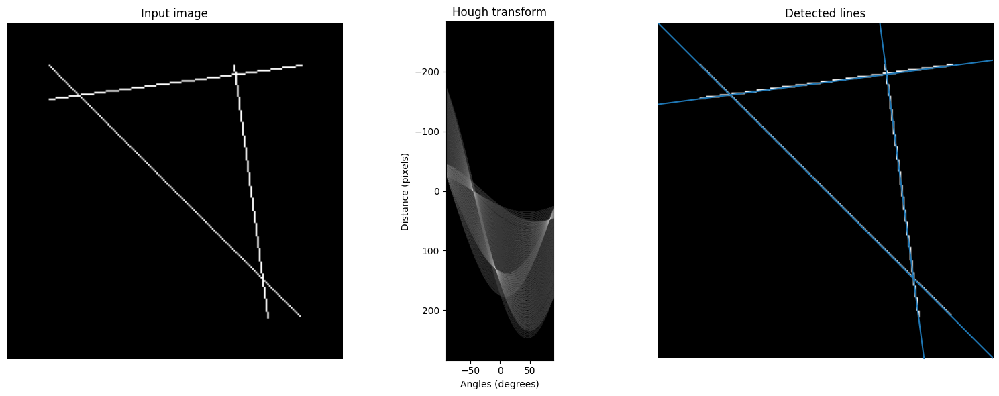

In [56]:
import numpy as np

from skimage.transform import hough_line, hough_line_peaks
from skimage.feature import canny
from skimage.draw import line as draw_line
from skimage import data

import matplotlib.pyplot as plt
from matplotlib import cm


# Constructing test image
image = np.zeros((200, 200))
idx = np.arange(25, 175)
image[idx, idx] = 255
image[draw_line(45, 25, 25, 175)] = 255
image[draw_line(25, 135, 175, 155)] = 255

# Classic straight-line Hough transform
# Set a precision of 0.5 degree.
tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 360, endpoint=False)
h, theta, d = hough_line(image, theta=tested_angles)

# Generating figure 1
fig, axes = plt.subplots(1, 3, figsize=(15, 6))
ax = axes.ravel()

ax[0].imshow(image, cmap=cm.gray)
ax[0].set_title('Input image')
ax[0].set_axis_off()

angle_step = 0.5 * np.diff(theta).mean()
d_step = 0.5 * np.diff(d).mean()
bounds = [
    np.rad2deg(theta[0] - angle_step),
    np.rad2deg(theta[-1] + angle_step),
    d[-1] + d_step,
    d[0] - d_step,
]
ax[1].imshow(np.log(1 + h), extent=bounds, cmap=cm.gray, aspect=1 / 1.5)
ax[1].set_title('Hough transform')
ax[1].set_xlabel('Angles (degrees)')
ax[1].set_ylabel('Distance (pixels)')
ax[1].axis('image')

ax[2].imshow(image, cmap=cm.gray)
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_axis_off()
ax[2].set_title('Detected lines')

for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
    (x0, y0) = dist * np.array([np.cos(angle), np.sin(angle)])
    ax[2].axline((x0, y0), slope=np.tan(angle + np.pi / 2))

plt.tight_layout()
plt.show()

### Probabilistic Hough Transform

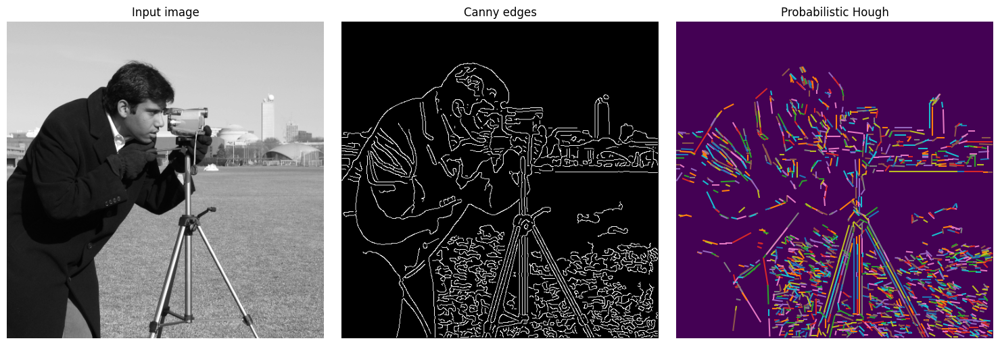

In [57]:
from skimage.transform import probabilistic_hough_line

# Line finding using the Probabilistic Hough Transform
image = data.camera()
edges = canny(image, 2, 1, 25)
lines = probabilistic_hough_line(edges, threshold=10, line_length=5, line_gap=3)

# Generating figure 2
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=cm.gray)
ax[0].set_title('Input image')

ax[1].imshow(edges, cmap=cm.gray)
ax[1].set_title('Canny edges')

ax[2].imshow(edges * 0)
for line in lines:
    p0, p1 = line
    ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
ax[2].set_xlim((0, image.shape[1]))
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_title('Probabilistic Hough')

for a in ax:
    a.set_axis_off()

plt.tight_layout()
plt.show()

## Try on image cuadros

Преобразование Хафа используется для обнаружения линий на изображении. В его основе лежит идея о том, что каждая точка на линии может представлять собой серию возможных линий в параметрическом пространстве, а пересечения в этом пространстве указывают на линии, которые существуют на изображении.

Функция: cv2.HoughLines или cv2.HoughLinesP (для версии, которая возвращает начальные и конечные точки линий).
Параметры:
- Изображение: Обычно бинарное изображение краев, полученное с помощью детектора границ (например, Canny).
- rho: Разрешение параметра расстояния в пикселях.
- theta: Разрешение параметра угла в радианах.
- threshold: Минимальное количество пересечений для обнаружения линии.

1. Функция hough_line() из библиотеки scikit-image имеет следующие параметры:

- image: numpy.ndarray
Исходное изображение. Должно быть двумерным (черно-белым).

- theta: array_like, optional (по умолчанию np.linspace(-np.pi / 2, np.pi / 2, 180))
Массив углов, для которых будет выполнено преобразование Хафа. Углы указываются в радианах. По умолчанию используется диапазон от -π/2 до π/2 с 180 точками.

- threshold: int, optional (по умолчанию None)
Порог для выделения границ. Точки с амплитудой градиента выше этого порога считаются граничными точками и участвуют в преобразовании Хафа. Если None, то порог вычисляется автоматически.

- line_length: int, optional (по умолчанию None)
Минимальная длина линии. Линии, найденные с использованием преобразования Хафа, короче этой длины, будут отброшены.

- line_gap: int, optional (по умолчанию None)
Максимальный разрыв между точками, который можно принять в качестве линии. Если разрыв между двумя точками больше этого значения, то они считаются разными линиями.

- probabilistic: bool, optional (по умолчанию False)
Если True, то будет использовано вероятностное преобразование Хафа, возвращающее только наиболее вероятные линии. Если False, то будет выполнено обычное преобразование Хафа.

- return_local_maxima: bool, optional (по умолчанию True)
Если True, то возвращается только локальный максимум в пространстве Хафа для каждой линии.

- hough_normed: bool, optional (по умолчанию False)
Если True, то возвращается нормализованное пространство Хафа.

## HT itself

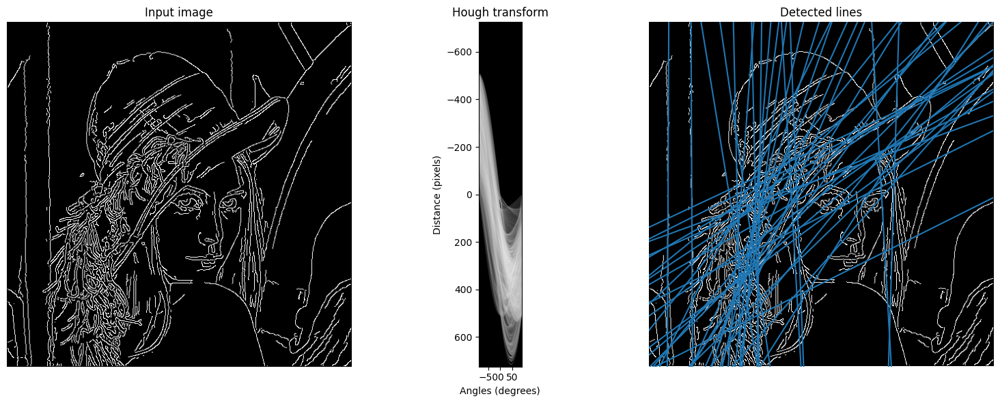

In [58]:
edges1 = feature.canny(im)

# Classic straight-line Hough transform
# Set a precision of 0.5 degree.
tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 360, endpoint=True)
h, theta, d = hough_line(edges1, theta=tested_angles)
  #h: Аккумуляторное пространство Хафа, представленное в виде массива NumPy.
  #Это двумерный массив, где каждый элемент соответствует определенной комбинации параметров прямой (угол и расстояние) в пространстве Хафа.

  #theta: Массив углов, в которых было выполнено преобразование Хафа.
  #Если параметр theta был указан, этот массив будет равен theta, иначе он будет автоматически сгенерирован в диапазоне от -π/2 до π/2 с шагом 1 радиан.

  #d:Массив расстояний, в которых было выполнено преобразование Хафа.
  #Этот массив представляет собой диапазон возможных расстояний между началом координат и найденной прямой.


# Generating figure 1
fig, axes = plt.subplots(1, 3, figsize=(15, 6))
ax = axes.ravel()

ax[0].imshow(edges1, cmap=cm.gray)
ax[0].set_title('Input image')
ax[0].set_axis_off()

angle_step = 0.5 * np.diff(theta).mean() #np.diff(theta) вычисляет разность между соседними значениями углов
                                         #np.mean() вычисляет среднее значение этой разности
                                         #Затем умножаем результат на 0.5, чтобы получить половину этого шага.

d_step = 0.5 * np.diff(d).mean()         #np.diff(d) вычисляет разность между соседними значениями

bounds = [                                 #bounds: Это массив, содержащий четыре значения: минимальный и максимальный углы, а также минимальное и максимальное расстояния в пространстве Хафа.

    np.rad2deg(theta[0] - angle_step),   #np.rad2deg(theta[0] - angle_step): Преобразует минимальный угол в радианах в градусы и вычитает из него половину шага угла. Это определяет нижнюю границу углов.
    np.rad2deg(theta[-1] + angle_step),  #np.rad2deg(theta[-1] + angle_step): Преобразует максимальный угол в радианах в градусы и добавляет к нему половину шага угла. Это определяет верхнюю границу углов.
    d[-1] + d_step,                      #d[-1] + d_step: Добавляет к максимальному расстоянию половину шага расстояния. Это определяет верхнюю границу расстояний.
    d[0] - d_step,                       #d[0] - d_step: Вычитает из минимального расстояния половину шага расстояния. Это определяет нижнюю границу расстояний.
]
ax[1].imshow(np.log(1 + h), extent=bounds, cmap=cm.gray, aspect=1 / 1.5)
ax[1].set_title('Hough transform')
ax[1].set_xlabel('Angles (degrees)')
ax[1].set_ylabel('Distance (pixels)')
ax[1].axis('image')

ax[2].imshow(edges1, cmap=cm.gray)
ax[2].set_ylim((edges1.shape[0], 0))
ax[2].set_axis_off()
ax[2].set_title('Detected lines')

for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
    (x0, y0) = dist * np.array([np.cos(angle), np.sin(angle)])
    ax[2].axline((x0, y0), slope=np.tan(angle + np.pi / 2))

plt.tight_layout()
plt.show()

## The first step

### What is the function that we use to obtain this space, which parameters it has, and what is returned

- Функция для Получения Пространства Аккумулятора:
- Функция: cv2.HoughLines или cv2.HoughLinesP (для версии, которая возвращает начальные и конечные точки линий).
- Параметры:
1. Изображение: Обычно бинарное изображение краев, полученное с помощью детектора границ (например, Canny).
2. rho: Разрешение параметра расстояния в пикселях.
3. theta: Разрешение параметра угла в радианах.
4. threshold: Минимальное количество пересечений для обнаружения линии.
- Возвращаемое значение:
1. Массив, содержащий параметры обнаруженных линий (для HoughLines) или координаты начальных и конечных точек каждой линии (для HoughLinesP).

### Identify in the code, which is the variable corresponding to the accumulator space, what its size is, and why.


- Пространство Аккумулятора:

1. Переменная: Обычно это массив, возвращаемый функцией cv2.HoughLines.
2. Размер: Размер зависит от rho, theta и размеров изображения. Каждая ячейка представляет потенциальную линию на изображении.
3. Почему: Размер определяется диапазоном возможных значений расстояний и углов.

- Оси и Значения в Пространстве Аккумулятора:

1. Оси: Одна ось представляет угол θ (наклон линии), другая - расстояние ρ (расстояние от линии до начала координат).
2. Значения: Каждый элемент содержит количество голосов или точек, которые поддерживают существование линии с данными параметрами θ и ρ.
3. Характерные Черты:
 - Высокие значения указывают на большее количество точек, которые поддерживают данную линию.
 - Пики в аккумуляторном пространстве соответствуют наиболее вероятным линиям на изображении.

### Once the accumulator space has been computed

 - Идентификация Пиков
- Информация от Пиков:
1. Пики указывают на параметры (θ, ρ) линий, которые наиболее вероятно присутствуют на изображении.

- Зависимость Значений Пиков:
1. Высокие значения пиков зависят от количества точек изображения, которые лежат на предполагаемой линии.
2. Больше точек = выше вероятность.

- Функция для Локализации Пиков:
1. Функция: cv2.HoughLines (или использование дополнительных методов для нахождения максимальных значений в аккумуляторе, если используется кастомная реализация).
2. Возвращаемое значение: Массив параметров (θ, ρ) для каждой найденной линии.

## Probabilistic Hough Transform

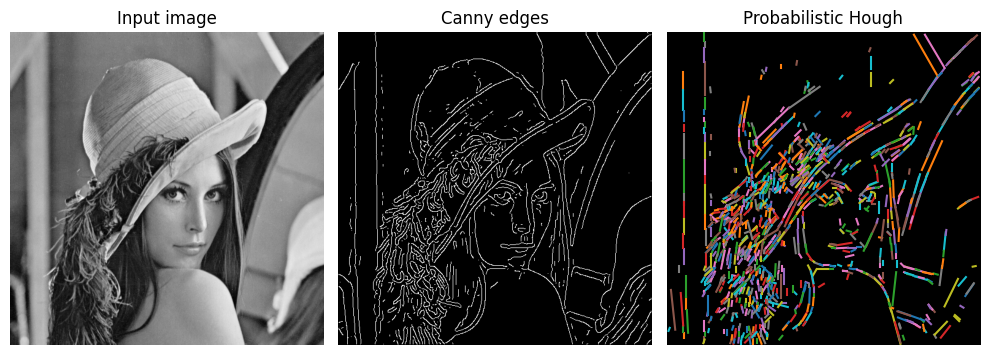

In [59]:
edges = canny(im, 2, 20, 20)

# Line finding using the Probabilistic Hough Transform
lines = probabilistic_hough_line(edges, threshold=10, line_length=5, line_gap=3)

# Generating figure 2
fig, axes = plt.subplots(1, 3, figsize=(10, 10))#, sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(im, cmap=cm.gray)
ax[0].set_title('Input image')

ax[1].imshow(edges, cmap=cm.gray)
ax[1].set_title('Canny edges')

ax[2].imshow(np.zeros_like(edges), cmap=cm.gray)
for line in lines:
    p0, p1 = line
    ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
ax[2].set_xlim((0, image.shape[1]))
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_title('Probabilistic Hough')

for a in ax:
    a.set_axis_off()

plt.tight_layout()
plt.show()

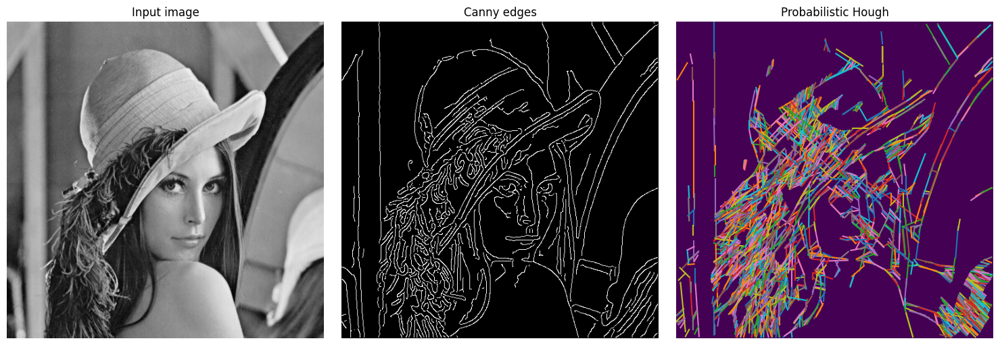

In [60]:
# Line finding using the Probabilistic Hough Transform
image = im
edges = canny(image, 2, 1, 25)
lines = probabilistic_hough_line(edges, threshold=10, line_length=10, line_gap=10)

# Generating figure 2
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=cm.gray)
ax[0].set_title('Input image')

ax[1].imshow(edges, cmap=cm.gray)
ax[1].set_title('Canny edges')

ax[2].imshow(edges * 0)
for line in lines:
    p0, p1 = line
    ax[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
ax[2].set_xlim((0, image.shape[1]))
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_title('Probabilistic Hough')

for a in ax:
    a.set_axis_off()

plt.tight_layout()
plt.show()

##Table 1. Four combinations of parameters of the Canny edge

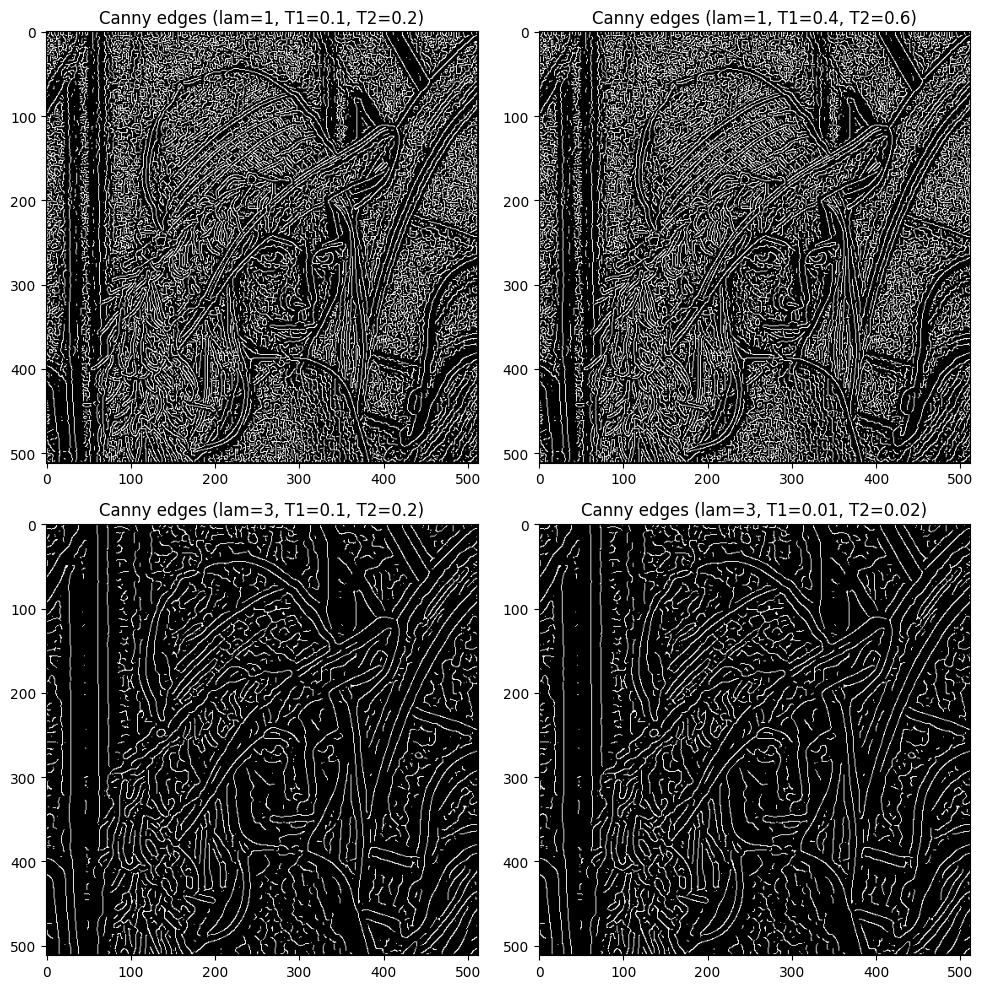

In [61]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
ax = axes.ravel()

params = [
    (1, 0.1, 0.2),
    (1, 0.4, 0.6),
    (3, 0.1, 0.2),
    (3, 0.01, 0.02)
]

for i, (lam, T1, T2) in enumerate(params):
    edges = canny(image, lam, T1, T2)
    ax[i].imshow(edges, cmap=cm.gray)
    ax[i].set_title(f'Canny edges (lam={lam}, T1={T1}, T2={T2})')

plt.tight_layout()
plt.show()

## Study the code that draws the peaks on the accumulator

### Explain

- Рисование пиков на пространстве аккумулятора:

1. Пространство аккумулятора в контексте преобразования Хафа — это двумерный массив,
 - где индексы массива соответствуют различным значениям θ (углы) и ρ (расстояния).
 - Каждый элемент массива (аккумулятор) считает количество точек изображения,
   которые могут представлять линию с соответствующими параметрами θ и ρ.
2. Пики в пространстве аккумулятора указывают на параметры линий, которые наиболее вероятно присутствуют на изображении.
 - Пики обычно находятся с помощью порогового значения или других методов максимального поиска.

- Вывод значений и полярных координат:
1. Для каждого пика (то есть каждой линии, обнаруженной на изображении) код обычно выводит его значение
  - (число точек, поддерживающих эту линию), а также
  - соответствующие полярные координаты θ (угол наклона линии относительно горизонтальной оси) и
  - ρ (расстояние от начала координат до ближайшей точки линии).

(256, 256)


array([[50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       ...,
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50]], dtype=uint8)
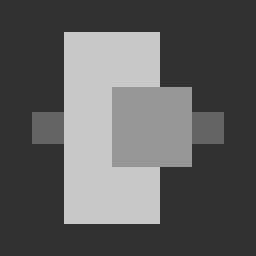

In [62]:
test_image_2 = Image.open("./Lab4/imgs-P4/cuadros.png")
print(test_image_1.size)
im1 = np.array(test_image_1.convert('L'))
im1



In [63]:
ls Lab4/imgs-P4


cuadros.png  lena.pgm


(512, 512)


array([[165, 165, 165, ..., 172, 158, 132],
       [165, 165, 165, ..., 172, 158, 132],
       [165, 165, 165, ..., 172, 158, 132],
       ...,
       [ 47,  47,  54, ..., 109, 105, 104],
       [ 48,  48,  58, ..., 108, 110, 113],
       [ 48,  48,  58, ..., 108, 110, 113]], dtype=uint8)
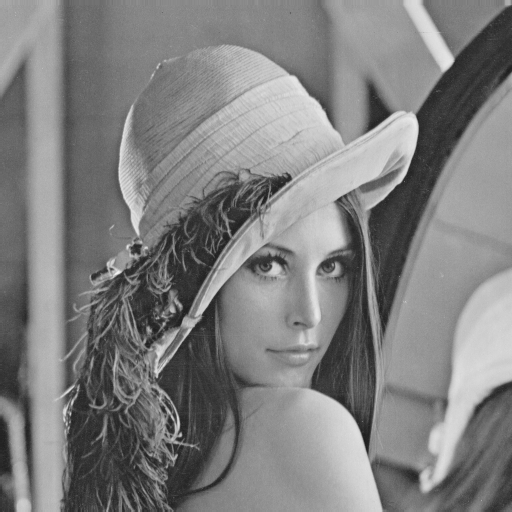

In [64]:
test_image_2 = Image.open("./Lab4/imgs-P4/lena.pgm")
print(test_image_2.size)
im2 = np.array(test_image_2.convert('L'))
im2

In [65]:
from skimage.transform import probabilistic_hough_line
edges = canny(im2, 2, 1, 25)
edges

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

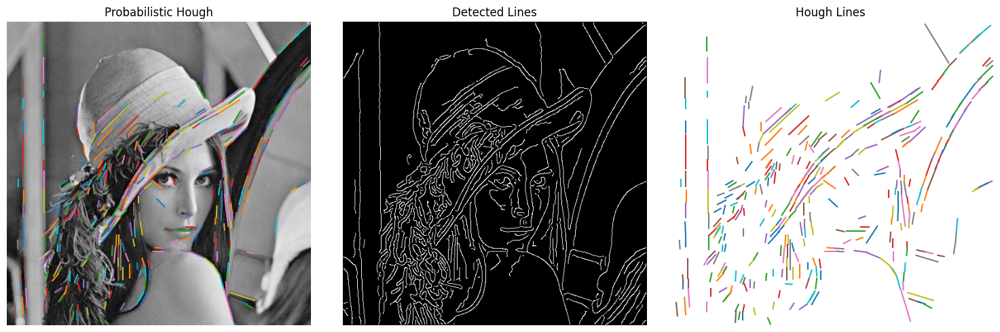

In [66]:
from skimage.transform import probabilistic_hough_line
import numpy as np
import matplotlib.pyplot as plt

# Загрузка изображения и применение детектора краев, например, Canny
#edges = canny(im2, 2, 1, 25)

# Выполнение преобразования Хафа
#lines = probabilistic_hough_line(edges, threshold=10, line_length=5, line_gap=3)
lines = probabilistic_hough_line(edges, threshold=10, line_length=10, line_gap=1)

# Визуализация результатов
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Визуализация результатов для первого изображения
if lines is not None:
    axes[0].imshow(im2, cmap='gray')  # Отображение изображения краев
    for line in lines:
        p0, p1 = line
        axes[0].plot((p0[0], p1[0]), (p0[1], p1[1]))

    axes[0].set_xlim((0, image.shape[1]))
    axes[0].set_ylim((image.shape[0], 0))
    axes[0].set_title('Probabilistic Hough')
    axes[0].axis('off')  # Отключение осей

# Визуализация результатов для второго изображения
axes[1].imshow(edges, cmap='gray')
axes[1].set_title('Detected Lines')
axes[1].axis('off')

# Визуализация еще одного изображения
for line in lines:
    p0, p1 = line
    axes[2].plot((p0[0], p1[0]), (p0[1], p1[1]))
axes[2].set_xlim((0, image.shape[1]))
axes[2].set_ylim((image.shape[0], 0))
axes[2].set_title("Hough Lines")
axes[2].axis('off')  # Отключение осей

plt.tight_layout()  # Для автоматического размещения графиков с учетом места
plt.show()

# 4. Exercises

## Exercises 1  Instead of using the function sobel

- Gx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=float)
- Gy = Gx.T
- gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve, sobel
from imageio import imread

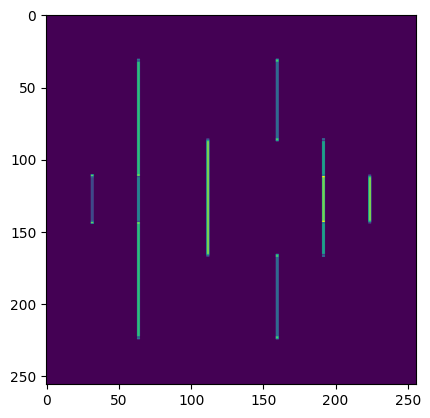

In [68]:
Gx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=float)
sobel_x = convolve(im1, Gx)
plt.imshow(sobel_x)

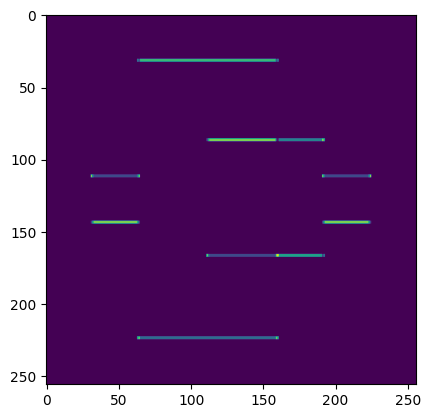

In [69]:
sobel_y = convolve(im1, Gx.T)
plt.imshow(sobel_y)

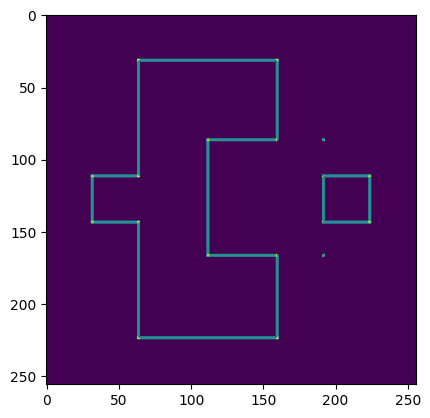

In [70]:
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
plt.imshow(gradient_magnitude)

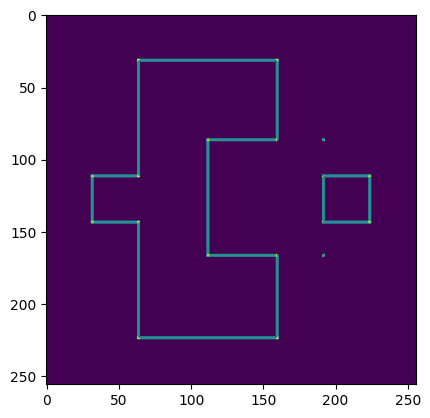

In [71]:
# Использование функции sobel() из scipy.ndimage
sobel_scipy = np.sqrt(sobel(im1, axis=0)**2 + sobel(im1, axis=1)**2)
plt.imshow(sobel_scipy)

## Exercises 2 Given the input image in Fig. 1

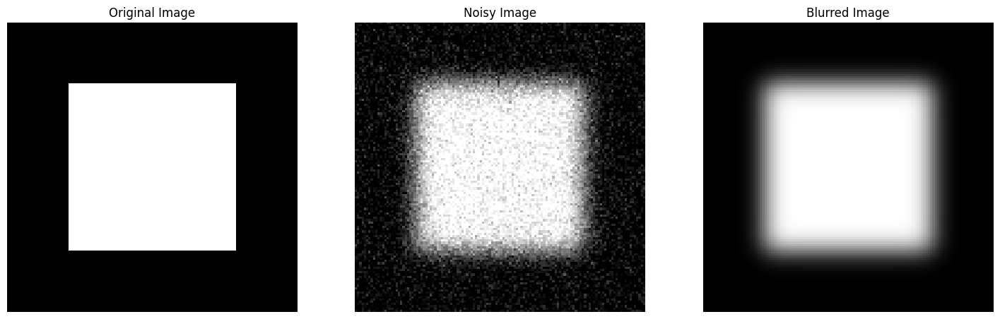

In [72]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Параметры изображения
image_size = 128
center_area = 74
noise_sigma = 0.9

# Создание базового черного изображения
image = np.zeros((image_size, image_size))

# Создание центральной белой области
center_start = (image_size - center_area) // 2
center_end = center_start + center_area
image[center_start:center_end, center_start:center_end] = 1

# Применение гауссовского размытия для плавного перехода
blurred_image = gaussian_filter(image, sigma=5)

# Добавление гауссовского шума ко всему изображению
noisy_image = blurred_image + np.random.normal(0, 0.1, image.shape)



# Визуализация исходного изображения, зашумленного и размытого изображений
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray', vmin=0, vmax=1)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(noisy_image, cmap='gray', vmin=0, vmax=1)
plt.title("Noisy Image")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(blurred_image, cmap='gray', vmin=0, vmax=1)
plt.title("Blurred Image")
plt.axis('off')

plt.show()


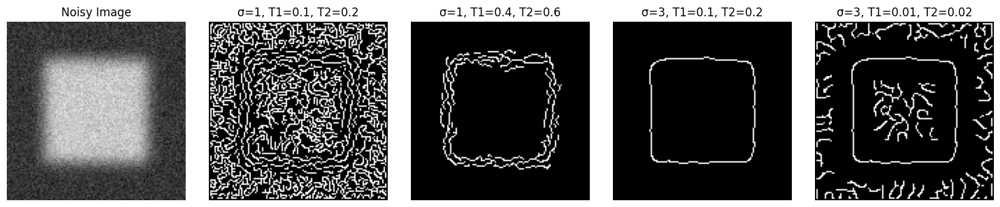

In [73]:
params = [
    (1, 0.1, 0.2),  # a
    (1, 0.4, 0.6),  # b
    (3, 0.1, 0.2),  # c
    (3, 0.01, 0.02) # d
]

# Визуализация результатов
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
axes[0].imshow(noisy_image, cmap='gray')
axes[0].set_title("Noisy Image")
axes[0].axis('off')

# Применение детектора Канни с различными параметрами
for i, (sigma, T1, T2) in enumerate(params, 1):
    edges = feature.canny(noisy_image, sigma=sigma, low_threshold=T1, high_threshold=T2, use_quantiles=False)
    axes[i].imshow(edges, cmap='gray')
    axes[i].set_title(f"σ={sigma}, T1={T1}, T2={T2}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

**Combination a (σ=1, T1=0.1, T2=0.2):**

Low blur and low thresholds. Will result in detecting many small and weak edges. The image will be more "noisy" with lots of tiny edges.

**Combination b (σ=1, T1=0.4, T2=0.6):**

Low blur but high thresholds. Fewer edges will be detected compared to the previous one, as only strong edges will pass through the high thresholds.

**Combination c (σ=3, T1=0.1, T2=0.2):**

High blur with low thresholds. Most small details and noise will be removed, but only the most obvious edges will be detected. The image will be cleaner.

**Combination d (σ=3, T1=0.01, T2=0.02):**

High blur with very low thresholds. This will allow detecting very weak edges, but the image may be overwhelmed with minimal gradients, which is not always useful.

## Exercises 3 Gto rotate the input image some degrees α

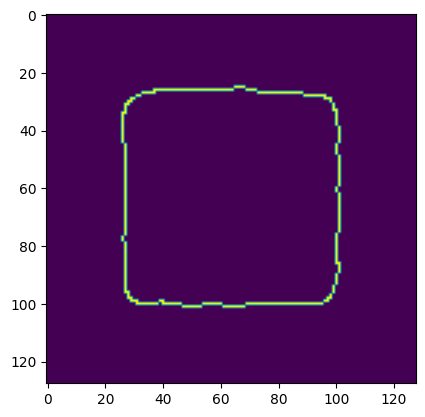

In [74]:
image = feature.canny(noisy_image, 3, 0.1, 0.2, use_quantiles=False)
plt.imshow(image)

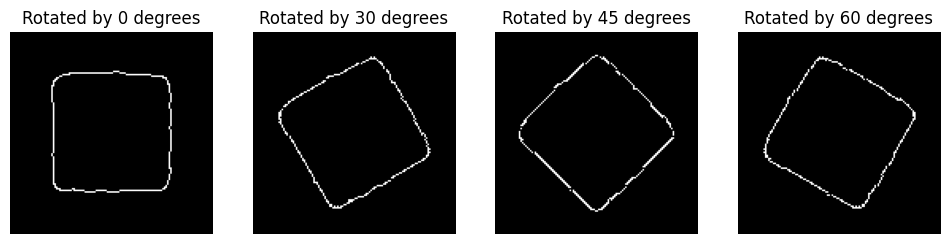

In [75]:
from skimage.transform import rotate
# Параметры для поворота и HT

angles = [0, 30, 45, 60]  # углы поворота в градусах

plt.figure(figsize=(12, 3))
for i, angle in enumerate(angles):
    # Поворачиваем изображение
    rotated_image = rotate(image, angle, resize=False)
    edges = canny(rotated_image, sigma=3)
    H, theta, d = hough_line(edges)

    plt.subplot(1, 4, i+1)
    plt.imshow(rotated_image, cmap='gray')
    plt.title(f"Rotated by {angle} degrees")
    plt.axis('off')

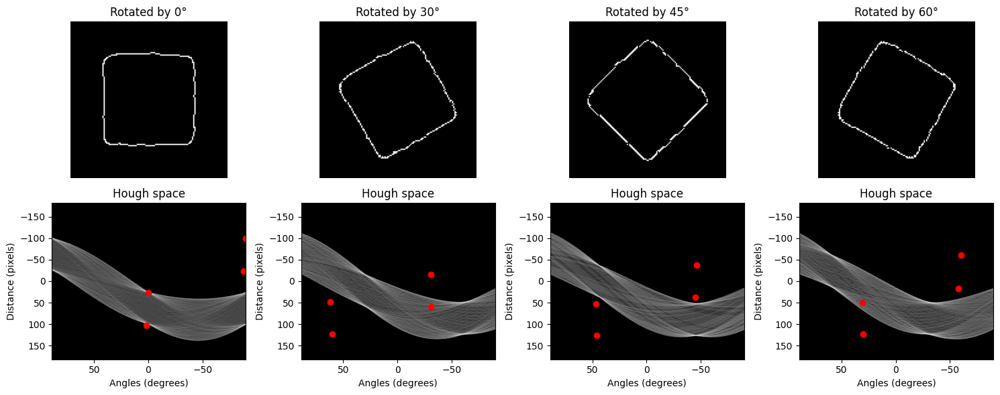

In [76]:
# Параметры для поворота и HT
angles = [0, 30, 45, 60]  # Углы поворота в градусах

# Подготовка к визуализации
fig, axes = plt.subplots(2, len(angles), figsize=(15, 6))

for i, angle in enumerate(angles):
    # Поворачиваем изображение
    rotated_image = rotate(image, angle, resize=False, mode='edge')
    #edges = canny(rotated_image, sigma=1)
    #H, theta, d = hough_line(edges)
    H, theta, d = hough_line(rotated_image)

    # Находим пики в пространстве Хафа
    accum, angles, dists = hough_line_peaks(H, theta, d)

    # Визуализация изображения
    axes[0, i].imshow(rotated_image, cmap='gray')
    axes[0, i].set_title(f"Rotated by {angle}°")
    axes[0, i].axis('off')

    # Визуализация пространства Хафа
    axes[1, i].imshow(np.log(1 + H), extent=[np.rad2deg(theta[-1]), np.rad2deg(theta[0]), d[-1], d[0]],
                      aspect='auto', cmap='gray')

                      #H это массив, который представляет пространство аккумулятора Хафа
                       #extent задает границы осей координат для изображения, позволяя правильно масштабировать оси так,
                       #чтобы они соответствовали фактическим параметрам θ (углы в градусах) и ρ (расстояния в пикселях).
                        #np.rad2deg() конвертирует радианы в градусы, что делает ось углов более понятной для восприятия.
                          #aspect='auto': Этот параметр контролирует соотношение сторон изображения в подграфике

      # - extent принимает список из четырех значений, которые определяют границы осей X и Y на изображении: [xmin, xmax, ymin, ymax]
      # np.rad2deg(theta[-1]): Это преобразует последний элемент массива theta из радианов в градусы.
      # - theta содержит значения углов, которые были использованы при вычислении преобразования Хафа.
      # - theta[-1] последний элемент массива theta который используется как начальная точка (xmin) для оси X на изображении.
      # - theta[0] Это максимальный угол (самый "левый" угол), используемый как конечная точка (xmax) для оси X.
      # - d[-1]: Представляет максимальное значение дистанции ρ (ро), которое встречается в пространстве Хафа.
      #   - В контексте преобразования Хафа, d или ρ является перпендикулярным расстоянием от происхождения до линии, проходящей через точку изображения.
      #   - Это значение используется как начальная точка (ymin) для оси Y.
      # - d[0]: Минимальное значение дистанции ρ, используемое как конечная точка (ymax) для оси Y.



    axes[1, i].set_title('Hough space')
    axes[1, i].set_xlabel('Angles (degrees)')
    axes[1, i].set_ylabel('Distance (pixels)')
    axes[1, i].autoscale(False)
    axes[1, i].plot(np.rad2deg(angles), dists, 'ro')

plt.tight_layout()
plt.show()

**Image Rotation:**

Image rotation alters the orientation of objects in the image, which should result in changes to the parameters of detected lines in the Hough space.

**Hough Accumulator Space:**

The Hough accumulator space (H) will have peaks corresponding to potential lines in the image. The number of peaks depends on the number of clearly defined lines and the settings of the Hough Transform parameters.

**Relationship between θ and α:**

The angle θ in the Hough space corresponds to the slope angle of the line relative to the horizontal axis. When the image is rotated by an angle α, it is expected that the angles of all lines will change by α degrees. This should lead to a shift of the θ angle in the Hough space by the amount of α.

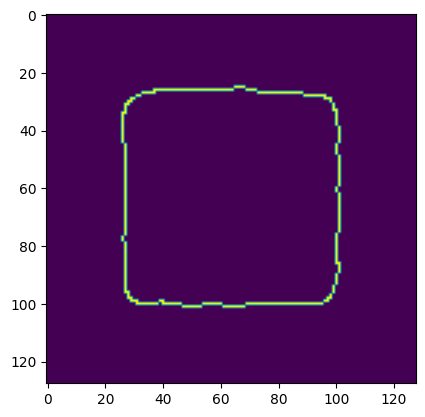

In [77]:
plt.imshow(image)

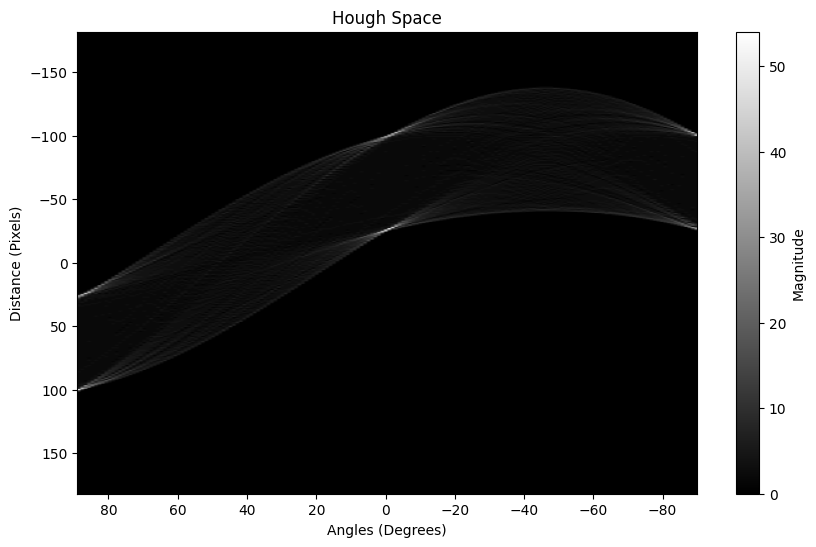

In [78]:
H, theta, d = hough_line(image)
plt.figure(figsize=(10, 6))
plt.imshow(H, aspect='auto', extent=[np.rad2deg(theta[-1]), np.rad2deg(theta[0]), d[-1], d[0]],
           cmap='gray', origin='lower')
           #origin='lower' указывает, что начальная точка (0, 0) массива должна находиться
plt.title('Hough Space')
plt.xlabel('Angles (Degrees)')
plt.ylabel('Distance (Pixels)')
plt.colorbar(label='Magnitude')
plt.show()

## Exercises 4 Histograms of gradients (Histogram of Oriented Gradients, HOG)

ти гистограммы потом можно использовать как признаки для обучения классификаторов, таких как SVM, для задач распознавания и обнаружения объектов.

### Test code in parts for HOG

In [81]:
from skimage.filters import sobel, sobel_h, sobel_v

array([[50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       ...,
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50]], dtype=uint8)
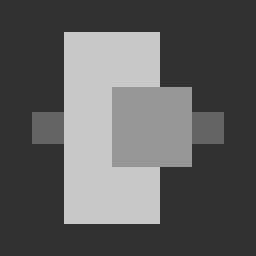

In [82]:
im1

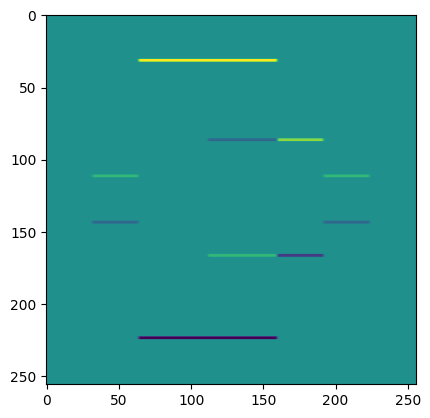

In [83]:
g_x = sobel_h(im1)
g_y = sobel_v(im1)
plt.imshow(g_x)

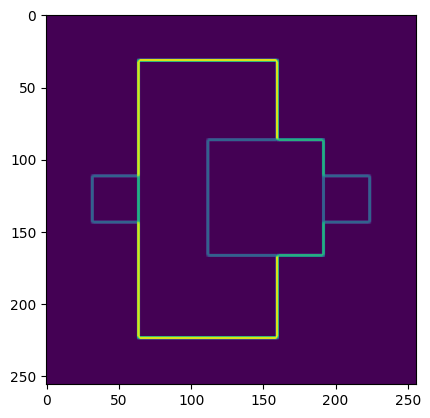

In [84]:
magnitude = np.sqrt(g_x**2 + g_y**2)
plt.imshow(magnitude)

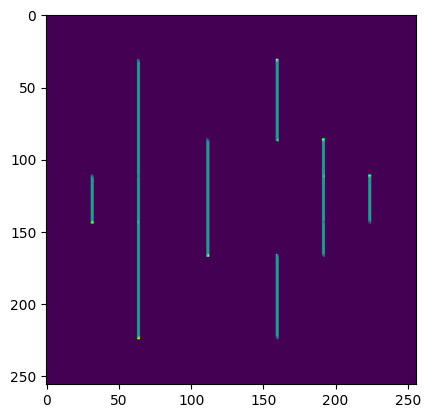

In [85]:
orientation = np.arctan2(g_y, g_x) * (180 / np.pi) % 180
plt.imshow(orientation)

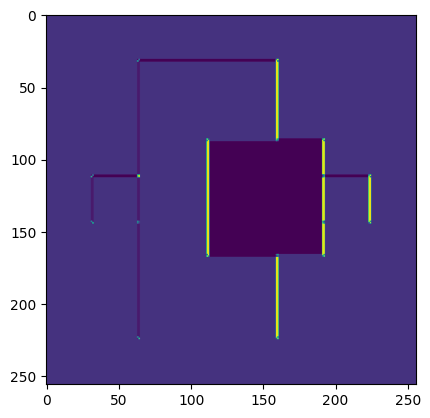

In [86]:
orientation1 = np.arctan2(g_y, g_x) * ((180 / np.pi) + 180) % 180
plt.imshow(orientation1)

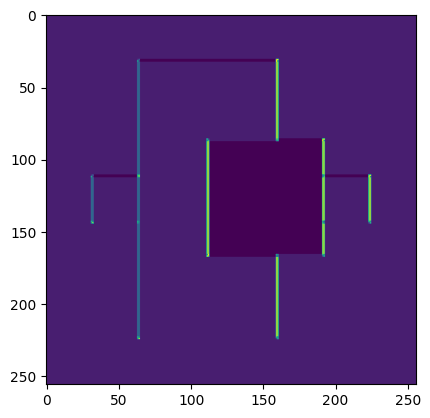

In [87]:
result_orientation = (orientation + orientation1) % 360
plt.imshow(result_orientation)

In [88]:
nbins = 21

In [91]:
bin_edges = np.linspace(0, 180, nbins) #равномерно распределенных между 0 и 180 градусами, с шагом, который зависит от количества бинов (nbins).
bin_edges

array([  0.,   9.,  18.,  27.,  36.,  45.,  54.,  63.,  72.,  81.,  90.,
        99., 108., 117., 126., 135., 144., 153., 162., 171., 180.])

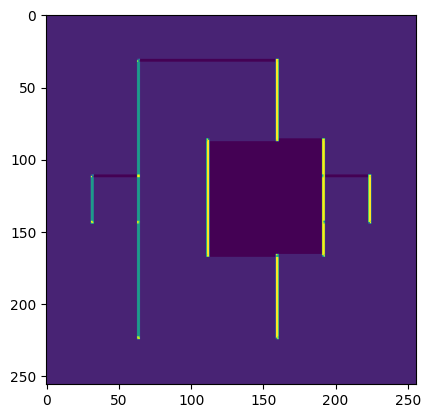

In [92]:
#разбиение значений ориентации (orientation) на бины согласно предопределенным границам бинов (bin_edges).
#Функция np.digitize() возвращает индексы бинов, в которые попадают значения ориентации.
#Вычитание 1 используется для того, чтобы индексы начинались с 0 вместо 1, так как в Python индексация начинается с 0.

bin_indices = np.digitize(result_orientation, bin_edges) - 1
plt.imshow(bin_indices)

In [93]:
histogram = np.zeros(nbins)
for i in range(nbins):
    histogram[i] = np.sum(magnitude[bin_indices == i])
for i, value in enumerate(histogram):
    print(f"Bin {i}: {value}")

Bin 0: 175.68627450980406
Bin 1: 0.0
Bin 2: 175.68627450980458
Bin 3: 0.0
Bin 4: 0.0
Bin 5: 1.1091871077436037
Bin 6: 0.0
Bin 7: 1.0850952755479735
Bin 8: 0.0
Bin 9: 0.0
Bin 10: 0.9058854184077851
Bin 11: 219.3282171637739
Bin 12: 0.4438914283400695
Bin 13: 0.34662097116987634
Bin 14: 0.8272702407859098
Bin 15: 1.0671655763526524
Bin 16: 0.0
Bin 17: 1.109187107743604
Bin 18: 1.240108886340541
Bin 19: 1.240108886340541
Bin 20: 228.03705564483073


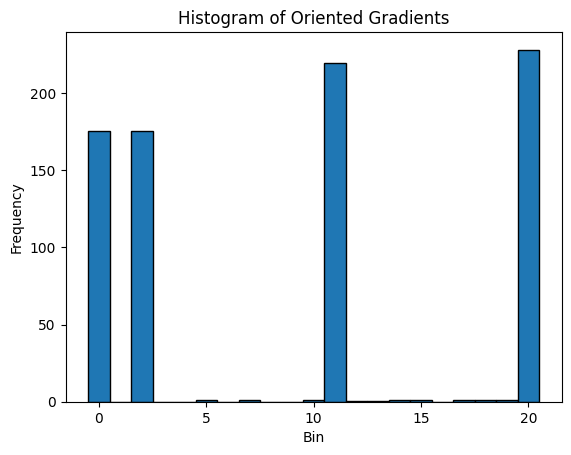

In [94]:
plt.bar(range(nbins), histogram, width=1, edgecolor='black')
plt.title('Histogram of Oriented Gradients')
plt.xlabel('Bin')
plt.ylabel('Frequency')
plt.show()

### Def for HOG and Test

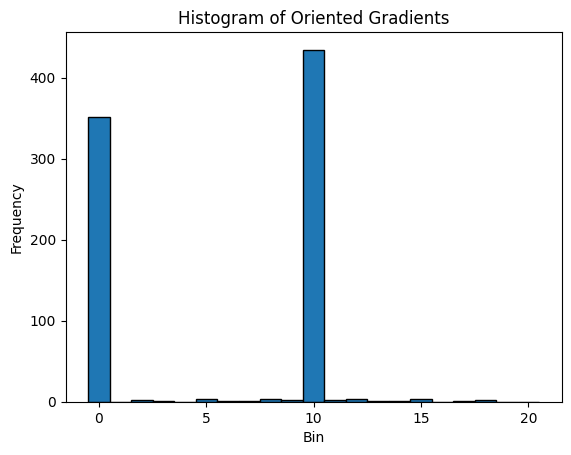

In [95]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import color, io
from skimage.filters import sobel_h, sobel_v

def HOG(im, nbins):
    # Преобразование изображения в градации серого, если оно цветное
    if len(im.shape) == 3:
        im = color.rgb2gray(im)

    # Вычисление горизонтальных и вертикальных градиентов
    g_x = sobel_h(im)
    g_y = sobel_v(im)

    # Вычисление величины и направления градиентов
    magnitude = np.sqrt(g_x**2 + g_y**2)
    orientation = np.arctan2(g_y, g_x) * (180 / np.pi) % 180

    # Квантизация направлений в интервалы
    bin_edges = np.linspace(0, 180, nbins+1)
    bin_indices = np.digitize(orientation, bin_edges) - 1

    # Накопление значений в гистограмму
    histogram = np.zeros(nbins)
    for i in range(nbins):
        histogram[i] = np.sum(magnitude[bin_indices == i])

    return histogram

# Пример использования
image = im1
nbins = 21  # Количество интервалов гистограммы
hist = HOG(image, nbins)

# Визуализация гистограммы
plt.bar(range(nbins), hist, width=1, edgecolor='black')
plt.title('Histogram of Oriented Gradients')
plt.xlabel('Bin')
plt.ylabel('Frequency')
plt.show()


## Exercises 5 Write a function displayLines

## Test Var

array([[50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       ...,
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50],
       [50, 50, 50, ..., 50, 50, 50]], dtype=uint8)
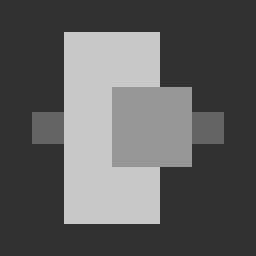

In [96]:
im1

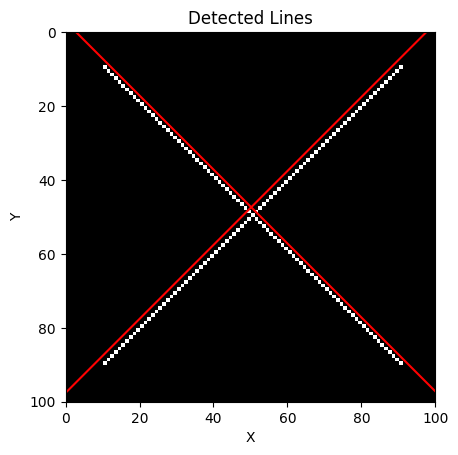

In [97]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import canny
from skimage.transform import hough_line, hough_line_peaks
from skimage.draw import line

# Функция для отображения линий, обнаруженных с помощью преобразования Хафа
def displayLines(image, peaks):
    H, W = image.shape
    plt.imshow(image, cmap='gray', extent=[0, W, 0, H])

    for _, angle, dist in peaks:
        y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
        y1 = (dist - W * np.cos(angle)) / np.sin(angle)
        plt.plot((0, W), (y0, y1), '-r')

    plt.xlim(0, W)
    plt.ylim(H, 0)
    plt.title('Detected Lines')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.show()

# Создание искусственного изображения с двумя пересекающимися линиями
image = np.zeros((100, 100), dtype=np.float64)
rr, cc = line(10, 10, 90, 90)
image[rr, cc] = 1
rr, cc = line(10, 90, 90, 10)
image[rr, cc] = 1

# Применение детектора краев Канни
edges = canny(image, sigma=2)

# Преобразование Хафа
H, theta, d = hough_line(edges)

# Обнаружение пиков в пространстве Хафа
peaks = hough_line_peaks(H, theta, d)

# Визуализация изображения и линий
displayLines(image, zip(*peaks))



## Way 1

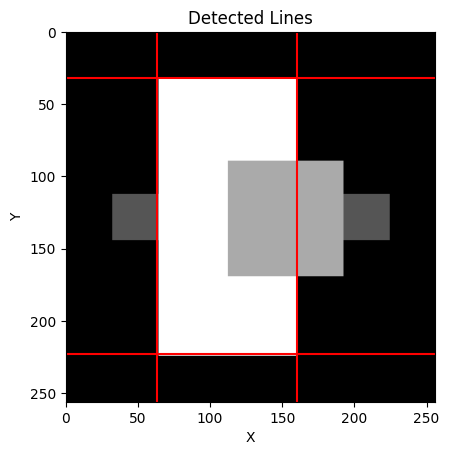

In [98]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.transform import hough_line, hough_line_peaks
from skimage import img_as_float

def displayLines(image, peaks):
    H, W = image.shape[:2]
    plt.imshow(image, cmap='gray', extent=[0, W, 0, H])

    for _, angle, dist in peaks:
        cos_angle = np.cos(angle)
        sin_angle = np.sin(angle)

        if np.abs(sin_angle) > 1e-5:  # Проверка на достаточное отличие от нуля
            y0 = (dist - 0 * cos_angle) / sin_angle
            y1 = (dist - W * cos_angle) / sin_angle
            plt.plot((0, W), (y0, y1), '-r')
        else:  # Для почти вертикальных линий, когда sin(angle) ~ 0
            x0 = dist / cos_angle
            plt.axvline(x=x0, color='red')  # Рисуем вертикальную линию

    plt.xlim(0, W)
    plt.ylim(H, 0)
    plt.title('Detected Lines')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.show()

# Загрузка изображения
image_path = './Lab4/imgs-P4/cuadros.png'  #  путь
image = imread(image_path)
image_gray = rgb2gray(img_as_float(image))  # Преобразование в градации серого

# Применение детектора краев Канни
edges = canny(image_gray, sigma=3)

# Преобразование Хафа
H, theta, d = hough_line(edges)

# Обнаружение пиков в пространстве Хафа
peaks = hough_line_peaks(H, theta, d)

# Визуализация изображения и линий
displayLines(image_gray, zip(*peaks))


## Way2 This way better for angle control

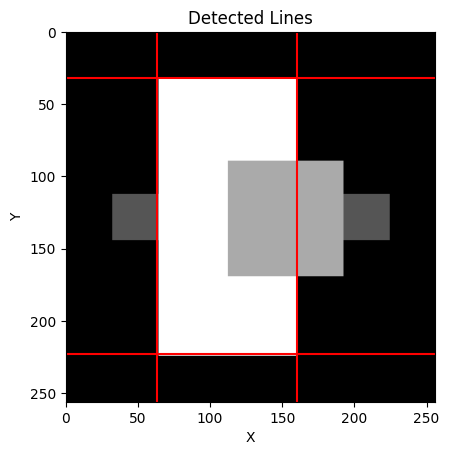

In [99]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.transform import hough_line, hough_line_peaks
from skimage import img_as_float

def displayLines(image, peaks):
    H, W = image.shape[:2]
    plt.imshow(image, cmap='gray', extent=[0, W, 0, H])

    for _, angle, dist in peaks:
        cos_angle = np.cos(angle)
        sin_angle = np.sin(angle)

        if np.abs(sin_angle) > 1e-5:  # Условие для не-вертикальных линий
            y0 = (dist - 0 * cos_angle) / sin_angle
            y1 = (dist - W * cos_angle) / sin_angle
            plt.plot((0, W), (y0, y1), '-r')
        if np.abs(cos_angle) > 1e-5:  # Условие для не-горизонтальных линий
            x0 = (dist - 0 * sin_angle) / cos_angle
            x1 = (dist - H * sin_angle) / cos_angle
            plt.plot((x0, x1), (0, H), '-r')

    plt.xlim(0, W)
    plt.ylim(H, 0)
    plt.title('Detected Lines')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.show()

# Загрузка изображения
image_path = './Lab4/imgs-P4/cuadros.png'  # путь к вашему изображению
image = imread(image_path)
image_gray = rgb2gray(img_as_float(image))  # Преобразование в градации серого

# Применение детектора краев Канни
edges = canny(image_gray, sigma=3)

# Преобразование Хафа
H, theta, d = hough_line(edges)

# Обнаружение пиков в пространстве Хафа
peaks = hough_line_peaks(H, theta, d)

# Визуализация изображения и линий
displayLines(image_gray, zip(*peaks))


In [100]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.transform import hough_line, hough_line_peaks
from skimage import img_as_float
from skimage.filters import gaussian

def displayLines(image, edges, peaks):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # Создание сетки для 2 изображений

    # Отображение изображения краев
    axes[0].imshow(edges, cmap='gray')
    axes[0].set_title('Canny Edge Detection')
    axes[0].set_xlabel('X')
    axes[0].set_ylabel('Y')

    H, W = image.shape[:2]
    axes[1].imshow(image, cmap='gray', extent=[0, W, 0, H])

    for _, angle, dist in peaks:
        cos_angle = np.cos(angle)
        sin_angle = np.sin(angle)

        if np.abs(sin_angle) > 1e-5:  # Условие для не-вертикальных линий
            y0 = (dist - 0 * cos_angle) / sin_angle
            y1 = (dist - W * cos_angle) / sin_angle
            axes[1].plot((0, W), (y0, y1), '-r')
        if np.abs(cos_angle) > 1e-5:  # Условие для не-горизонтальных линий
            x0 = (dist - 0 * sin_angle) / cos_angle
            x1 = (dist - H * sin_angle) / cos_angle
            axes[1].plot((x0, x1), (0, H), '-r')

    axes[1].set_xlim(0, W)
    axes[1].set_ylim(H, 0)
    axes[1].set_title('Detected Lines')
    axes[1].set_xlabel('X')
    axes[1].set_ylabel('Y')

    plt.tight_layout()
    plt.show()




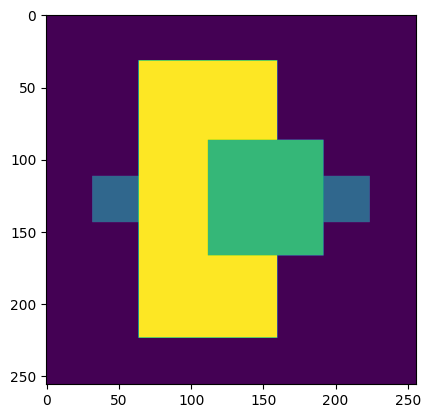

In [101]:
plt.imshow(image_gray)

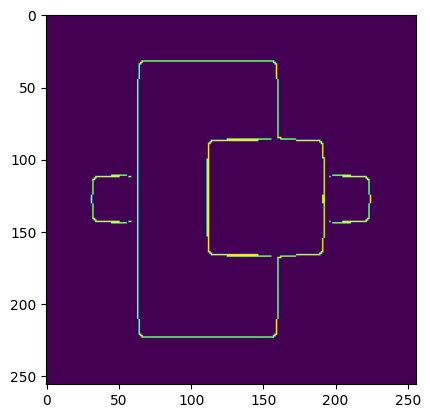

In [102]:
plt.imshow(edges)

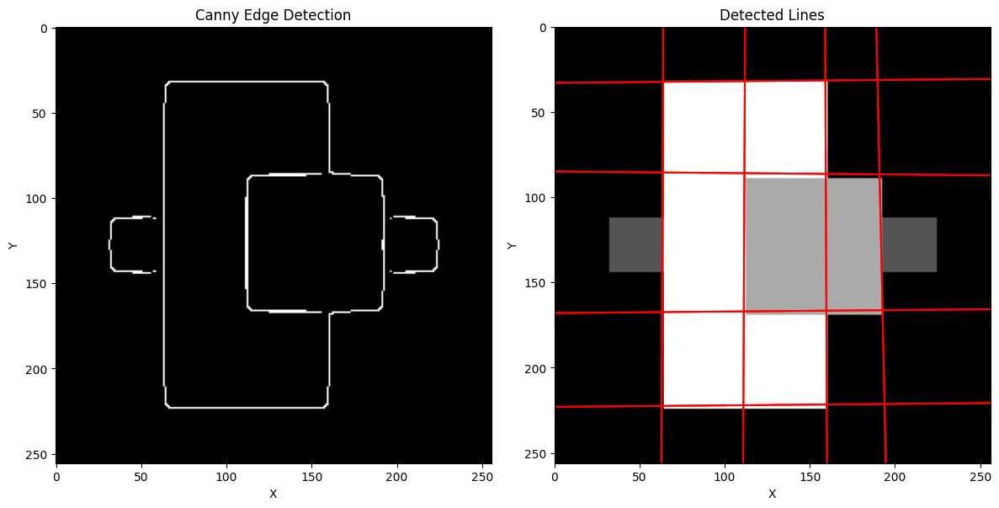

In [103]:
# Загрузка изображения
image_path = './Lab4/imgs-P4/cuadros.png'  # путь
image = imread(image_path)

image_gray = rgb2gray(img_as_float(image))  # Преобразование в градации серого
#image_gray = img_as_float(image)



#image_gray = gaussian(image_gray, sigma=1)

# Применение детектора краев Канни
edges = canny(image_gray, sigma=3)
#edges = np.logical_not(edges)

# Применение детектора краев Канни с измененными порогами
#edges = canny(image_gray, sigma=2, low_threshold=10, high_threshold=50)

# Преобразование Хафа
#H, theta, d = hough_line(edges)

# Преобразование Хафа с увеличенным разрешением
diagonal = int(np.hypot(*image_gray.shape))  # Вычисление диагонали изображения
# Преобразование Хафа с увеличенным разрешением углов
H, theta, d = hough_line(edges, theta=np.linspace(-np.pi / 2, np.pi / 2, 360))


# Обнаружение пиков в пространстве Хафа
peaks = hough_line_peaks(H, theta, d, threshold=0.4*np.max(H))

# Визуализация изображения краев и линий
displayLines(image_gray, edges, zip(*peaks))

## Exercises 6  detected the actual segments

Один из подходов — использовать результаты преобразования Хафа для маскирования исходного изображения и дальнейшего уточнения положения линий.

- Применение Преобразования Хафа
- Маскирование Изображения
- Поиск Сегментов
- Детекция Краев
- Идентификация Сегментов

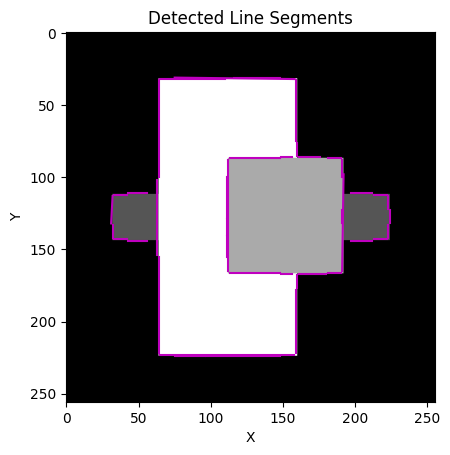

In [104]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.transform import probabilistic_hough_line

# Загрузка и подготовка изображения
image = imread('./Lab4/imgs-P4/cuadros.png')
image_gray = rgb2gray(image)
edges = canny(image_gray, sigma=2.5)

# Преобразование Хафа для обнаружения сегментов линий
lines = probabilistic_hough_line(edges, threshold=10, line_length=5, line_gap=2)

# Визуализация результатов
plt.imshow(image_gray, cmap='gray')
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'm-')

plt.title('Detected Line Segments')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()


- Группирование по Направлению
- Группирование по Расположению
- Определение Простых Фигур
- Поиск Многоугольников
- Анализ Вершин

In [105]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.transform import probabilistic_hough_line
from sklearn.cluster import DBSCAN
from collections import defaultdict

def group_lines(lines):
    line_data = []
    for (p0, p1) in lines:
        angle = np.arctan2(p1[1] - p0[1], p1[0] - p0[0])
        line_data.append([p0[0], p0[1], p1[0], p1[1], angle])

    angles = np.array([line[-1] for line in line_data]).reshape(-1, 1)
    clustering = DBSCAN(eps=0.1, min_samples=2).fit(angles)
    labels = clustering.labels_

    grouped_lines = defaultdict(list)
    for label, line in zip(labels, line_data):
        grouped_lines[label].append(line)

    return grouped_lines

def form_shapes(grouped_lines):
    shapes = []
    for label, lines in grouped_lines.items():
        if label == -1:
            continue
        points = []
        for line in lines:
            points.append((line[0], line[1]))  # x1, y1
            points.append((line[2], line[3]))  # x2, y2
        unique_points = list(dict.fromkeys(points))
        if len(unique_points) > 2:
            unique_points.append(unique_points[0])  # Close the shape
            shapes.append(unique_points)
    return shapes

def display_shapes(image, shapes):
    plt.imshow(image, cmap='gray')
    for shape in shapes:
        plt.plot([p[0] for p in shape], [p[1] for p in shape], 'm-')
    plt.title('Detected Shapes')
    plt.show()

#Пример: если shape = [(1, 2), (3, 4), (5, 6)], то [p[0] for p in shape] будет [1, 3, 5]
#shape = [(1, 2), (3, 4), (5, 6)], выражение [p[1] for p in shape] преобразуется в [2, 4, 6].
# ('m' для magenta) и сплошной ('-').

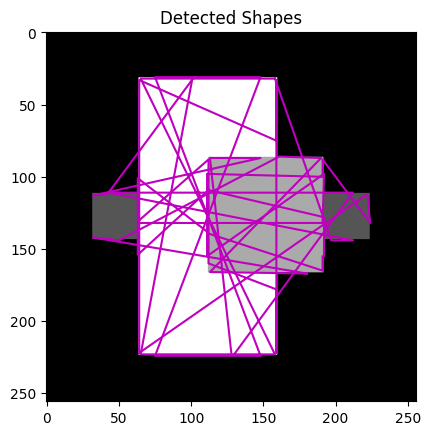

In [106]:
# Load and preprocess the image
image = imread('./Lab4/imgs-P4/cuadros.png')
image_gray = rgb2gray(image)
edges = canny(image_gray, sigma=2.5)


# Detect lines
#lines = probabilistic_hough_line(edges, threshold=10, line_length=5, line_gap=2)
lines = probabilistic_hough_line(edges, threshold=20, line_length=10, line_gap=5)

# Group lines and form shapes
grouped_lines = group_lines(lines)
shapes = form_shapes(grouped_lines)

# Display the results
display_shapes(image_gray, shapes)

In [107]:
def group_linesw(lines):
    line_data = []
    for (p0, p1) in lines:
        angle = np.arctan2(p1[1] - p0[1], p1[0] - p0[0])
        length = np.sqrt((p1[1] - p0[1])**2 + (p1[0] - p0[0])**2)
        line_data.append([p0[0], p0[1], p1[0], p1[1], angle, length])

    # Фильтрация коротких линий
    line_data = [line for line in line_data if line[5] > 10]  # length threshold

    # Кластеризация по углу
    angles = np.array([line[4] for line in line_data]).reshape(-1, 1)
    clustering = DBSCAN(eps=0.1, min_samples=1).fit(angles)
    labels = clustering.labels_
    print(labels)

    # Группирование линий по углу и проверка расстояний
    grouped_lines = defaultdict(list)
    for label, line in zip(labels, line_data):
        if label != -1:
            grouped_lines[label].append(line[:5])

    return grouped_lines

In [108]:
from shapely.geometry import Polygon

def form_shapesw(grouped_lines):
    shapes = []
    coordinates = []
    for lines in grouped_lines.values():
        points = []
        for line in lines:
            points.append((line[0], line[1]))  # x1, y1
            points.append((line[2], line[3]))  # x2, y2
        unique_points = list(dict.fromkeys(points))
        if len(unique_points) > 0:
            poly = Polygon(unique_points)
            if poly.is_valid and poly.area > 0:  # Проверка на валидность и минимальную площадь
              shapes.append(unique_points)
    # Проверка на четность количества элементов
    if len(shapes) % 2 != 0:
        print("Warning: The number of elements in 'shape' should be even. The last element will be ignored.")

    # Переформатирование списка в список пар координат
    coordinates = list(zip(shapes[::2], shapes[1::2]))  # Берем элементы с шагом 2
    print(coordinates)
    # Добавляем первую точку в конец для замыкания фигуры
    if coordinates:
        coordinates.append(coordinates[0])

    # Теперь coordinates содержит пары (x, y) и готов к использованию в plt.plot()

    return coordinates

In [109]:
from shapely.geometry import Polygon

def form_shapesw(grouped_lines):
    polygons = []
    for lines in grouped_lines.values():
        points = []
        for line in lines:
            points.append((line[0], line[1]))  # x1, y1
            points.append((line[2], line[3]))  # x2, y2
        unique_points = list(dict.fromkeys(points))
        if len(unique_points) >= 3:  # Многоугольник требует минимум 3 точки
            poly = Polygon(unique_points)
            if poly.is_valid and poly.area > 0:  # Проверка на валидность и минимальную площадь
                polygons.append(poly)

    coordinates = []
    for poly in polygons:
        x, y = poly.exterior.coords.xy  # Получаем координаты границ многоугольника
        coordinates.append(list(zip(x, y)))  # Создаем список пар координат и добавляем замыкающую точку

    return coordinates

### Test Convert to Polygon and print Data

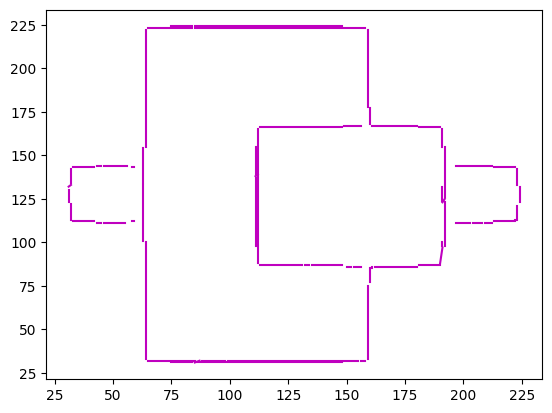

In [110]:
lines = probabilistic_hough_line(edges, threshold=1, line_length=1, line_gap=0)
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'm-')

In [111]:
import numpy as np
from sklearn.cluster import DBSCAN
from collections import defaultdict
from math import atan2, hypot
from shapely.geometry import Polygon, MultiPoint

# Assuming 'lines' is defined properly as described above
line_data = []
for (p0, p1) in lines:
    dx, dy = p1[0] - p0[0], p1[1] - p0[1]
    angle = atan2(dy, dx)
    length = hypot(dy, dx)
    line_data.append([p0[0], p0[1], p1[0], p1[1], angle, length])

min_length = 1  # Adjust as necessary based on your data scale
filtered_data = [line for line in line_data if line[5] > min_length]

angles = np.array([line[4] for line in filtered_data]).reshape(-1, 1)
clustering = DBSCAN(eps=0.15, min_samples=1).fit(angles)  # Adjusted eps and min_samples
labels = clustering.labels_

grouped_lines = defaultdict(list)
for label, line in zip(labels, filtered_data):
    grouped_lines[label].append(line)

polygons = []
for lines in grouped_lines.values():
    points = [point for line in lines for point in [(line[0], line[1]), (line[2], line[3])]]
    unique_points = list(dict.fromkeys(points))
    if len(unique_points) >= 3:
        points_collection = MultiPoint(unique_points)
        poly = points_collection.convex_hull
        if poly.is_valid and poly.area > 0 and isinstance(poly, Polygon):
            polygons.append(poly)
        else:
            print(f"Invalid or zero-area polygon skipped: {unique_points}")
    else:
        print(f"Not enough unique points to form a polygon: {unique_points}")

print("Generated polygons:", len(polygons))
for poly in polygons:
    exterior_coords = list(poly.exterior.coords)
    print(f"Polygon with {len(exterior_coords)} vertices")
    print("Coordinates:", exterior_coords)
    print(f"Area: {poly.area:.2f}, Perimeter: {poly.length:.2f}")
    print("")  # Adds a newline for better readability between polygon prints


Not enough unique points to form a polygon: [(87, 32), (85, 31)]
Not enough unique points to form a polygon: [(192, 125), (191, 123)]
Generated polygons: 4
Polygon with 13 vertices
Coordinates: [(75.0, 31.0), (65.0, 32.0), (33.0, 112.0), (33.0, 143.0), (65.0, 223.0), (75.0, 224.0), (148.0, 224.0), (158.0, 223.0), (222.0, 143.0), (222.0, 112.0), (158.0, 32.0), (148.0, 31.0), (75.0, 31.0)]
Area: 28585.00, Perimeter: 625.42

Polygon with 5 vertices
Coordinates: [(31.0, 132.0), (32.0, 133.0), (112.0, 139.0), (111.0, 138.0), (31.0, 132.0)]
Area: 74.00, Perimeter: 163.28

Polygon with 13 vertices
Coordinates: [(64.0, 33.0), (32.0, 113.0), (31.0, 123.0), (31.0, 130.0), (32.0, 142.0), (64.0, 222.0), (159.0, 222.0), (223.0, 142.0), (224.0, 132.0), (224.0, 123.0), (223.0, 114.0), (159.0, 33.0), (64.0, 33.0)]
Area: 28423.50, Perimeter: 625.20

Polygon with 7 vertices
Coordinates: [(150.0, 86.0), (51.0, 111.0), (181.0, 166.0), (190.0, 166.0), (212.0, 144.0), (180.0, 86.0), (150.0, 86.0)]
Area: 689

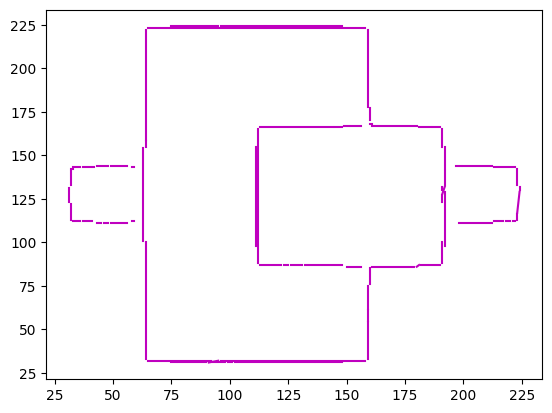

In [112]:
lines = probabilistic_hough_line(edges, threshold=1, line_length=1, line_gap=0)
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'm-')

### Test convert to Polygon and print figure

Not enough unique points to form a polygon: [(102, 31), (136, 31)]
Generated polygons: 2
POLYGON ((65 32, 65 223, 116 224, 148 224, 158 223, 158 32, 65 32))
POLYGON ((64 33, 63 101, 63 154, 64 222, 159 222, 192 129, 192 98, 64 33))


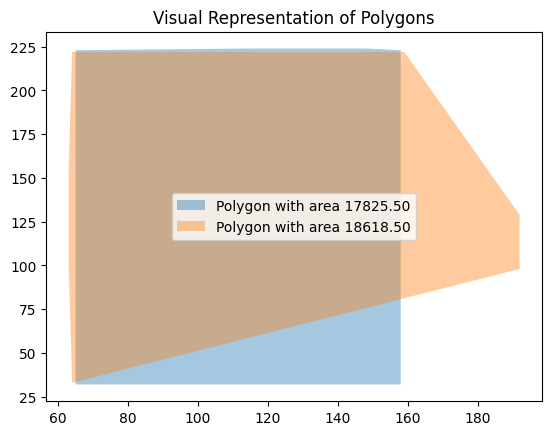

In [113]:
import numpy as np
from sklearn.cluster import DBSCAN
from collections import defaultdict
from math import atan2, hypot
from shapely.geometry import Polygon, MultiPoint
import matplotlib.pyplot as plt

# Assuming 'lines' is defined properly as described above
line_data = []
for (p0, p1) in lines:
    dx, dy = p1[0] - p0[0], p1[1] - p0[1]
    angle = atan2(dy, dx)
    length = hypot(dy, dx)
    line_data.append([p0[0], p0[1], p1[0], p1[1], angle, length])

min_length = 25  # Adjust as necessary based on your data scale
filtered_data = [line for line in line_data if line[5] > min_length]

angles = np.array([line[4] for line in filtered_data]).reshape(-1, 1)
clustering = DBSCAN(eps=0.15, min_samples=1).fit(angles)  # Adjusted eps and min_samples
labels = clustering.labels_

grouped_lines = defaultdict(list)
for label, line in zip(labels, filtered_data):
    grouped_lines[label].append(line)

polygons = []
for lines in grouped_lines.values():
    points = [point for line in lines for point in [(line[0], line[1]), (line[2], line[3])]]
    unique_points = list(dict.fromkeys(points))
    if len(unique_points) >= 4:
        points_collection = MultiPoint(unique_points)
        poly = points_collection.convex_hull
        if poly.is_valid and poly.area > 0 and isinstance(poly, Polygon):
            polygons.append(poly)
        else:
            print(f"Invalid or zero-area polygon skipped: {unique_points}")
    else:
        print(f"Not enough unique points to form a polygon: {unique_points}")

print("Generated polygons:", len(polygons))
for poly in polygons:
    print(poly)

# Visualization
fig, ax = plt.subplots()
for poly in polygons:
    x, y = poly.exterior.xy
    ax.fill(x, y, alpha=0.4, label=f'Polygon with area {poly.area:.2f}')

ax.set_title('Visual Representation of Polygons')
ax.legend()
plt.show()


### Another way to produse line figure

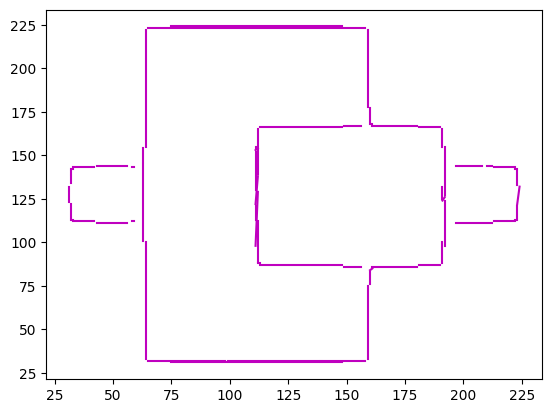

In [114]:
lines = probabilistic_hough_line(edges, threshold=1, line_length=1, line_gap=0)
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'm-')

#### Use NEW Lib for consolidate line

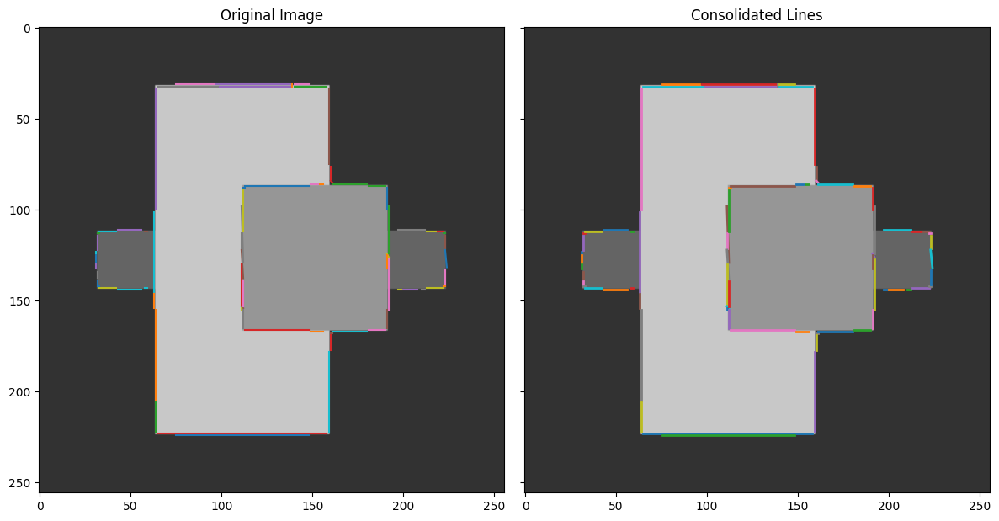

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import probabilistic_hough_line
from shapely.geometry import LineString, MultiLineString
from shapely.ops import linemerge, unary_union

# Example: Generate an image with edges (this should be replaced by your actual edges input)
from skimage.data import binary_blobs
from skimage.filters import sobel

#image = binary_blobs(length=200, seed=1)
#edges = sobel(image)

# Probabilistic Hough Transform
#lines = probabilistic_hough_line(edges, threshold=10, line_length=10, line_gap=3)

# Convert list of lines to Shapely LineString objects
line_strings = [LineString(line) for line in lines]

# Create a MultiLineString object
multi_line = MultiLineString(line_strings)

# Merge lines that are within a certain distance of each other
merged_lines = linemerge(multi_line)

# If lines are just touching or very close, we use unary_union to merge them
consolidated_lines = unary_union(merged_lines)

# Plotting the results
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Original Image')
for line in lines:
    p0, p1 = line
    ax[0].plot((p0[0], p1[0]), (p0[1], p1[1]))

ax[1].imshow(image, cmap=plt.cm.gray)
ax[1].set_title('Consolidated Lines')
for line in consolidated_lines.geoms:
    x, y = line.xy
    ax[1].plot(x, y, linewidth=2)

plt.tight_layout()
plt.show()


#### Use shapely.ops to Produse Line

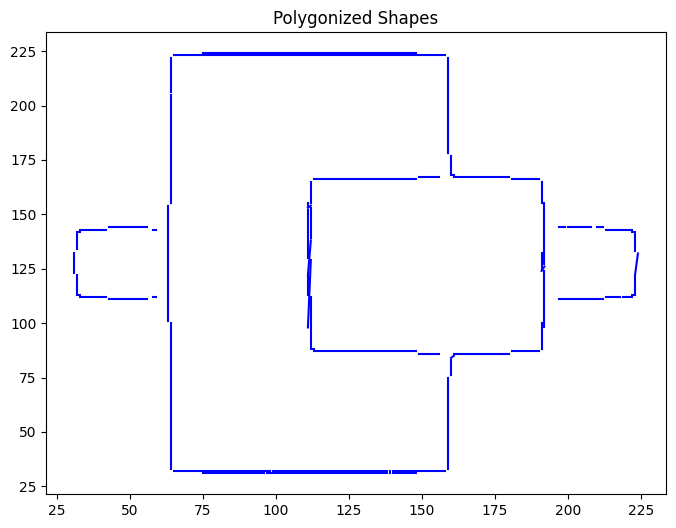

In [116]:
import matplotlib.pyplot as plt
from shapely.geometry import LineString, MultiLineString, Polygon
from shapely.ops import linemerge, unary_union, polygonize

# Assuming 'consolidated_lines' is a MultiLineString object from previous steps
# If 'consolidated_lines' is not a MultiLineString, convert it:
if not isinstance(consolidated_lines, MultiLineString):
    consolidated_lines = MultiLineString([line for line in consolidated_lines.geoms])

# Use unary_union to merge lines that touch or overlap, simplifying the connection process
unified_lines = unary_union(consolidated_lines)

# Polygonize: this function tries to form polygons from connected lines
polygons = list(polygonize(unified_lines))

# Plotting the results
fig, ax = plt.subplots(figsize=(8, 6))
for poly in polygons:
    x, y = poly.exterior.xy
    ax.fill(x, y, alpha=0.5, fc='r', edgecolor='black')  # Red fill with black border

# Add lines over the polygons to highlight the edges
for line in unified_lines.geoms:
    x, y = line.xy
    ax.plot(x, y, color='blue', linewidth=1.5)

ax.set_title('Polygonized Shapes')
plt.show()


#### Use shapely.ops to Produse Line and connect - Not good result

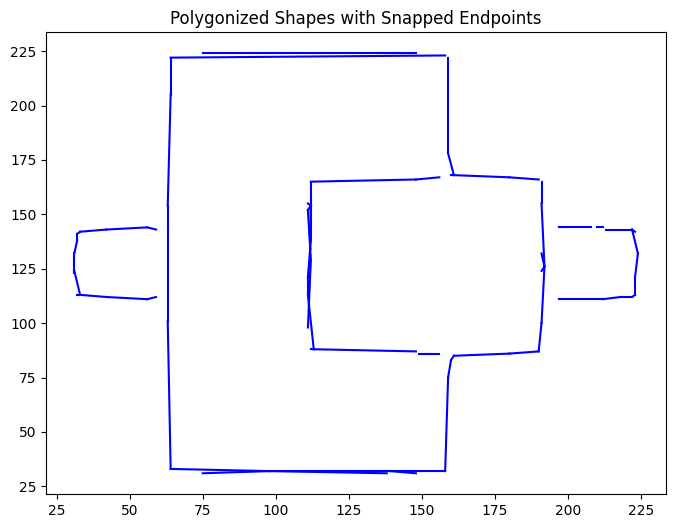

In [117]:
import matplotlib.pyplot as plt
from shapely.geometry import LineString, MultiLineString, Point
from shapely.ops import linemerge, unary_union, polygonize, snap

# Function to snap line endpoints close to other line endpoints
def snap_lines(lines, snap_threshold):
    snapped_lines = list(lines)  # Make a mutable copy of the line list
    for i in range(len(snapped_lines)):
        for j in range(i + 1, len(snapped_lines)):
            if snapped_lines[i].distance(snapped_lines[j]) < snap_threshold:
                # Modify line j to start or end at the closest endpoint of line i
                line1, line2 = snapped_lines[i], snapped_lines[j]
                if Point(line2.coords[0]).distance(Point(line1.coords[-1])) < snap_threshold:
                    snapped_lines[j] = LineString([line1.coords[-1], line2.coords[1]])
                elif Point(line2.coords[-1]).distance(Point(line1.coords[0])) < snap_threshold:
                    snapped_lines[j] = LineString([line2.coords[0], line1.coords[0]])
    return snapped_lines

# Assuming 'consolidated_lines' is your MultiLineString from previous code blocks
# Ensure it's a MultiLineString; if not, create it from line segments:
if not isinstance(consolidated_lines, MultiLineString):
    consolidated_lines = MultiLineString([LineString(line) for line in line_segments])

# Snap line endpoints that are within 5 pixels of each other
snap_threshold = 3
snapped_lines = snap_lines(consolidated_lines.geoms, snap_threshold)  # Corrected to use .geoms

# Use unary_union to merge lines that touch or overlap, simplifying the connection process
unified_lines = unary_union(MultiLineString(snapped_lines))

# Polygonize: this function tries to form polygons from connected lines
polygons = list(polygonize(unified_lines))

# Plotting the results
fig, ax = plt.subplots(figsize=(8, 6))
for poly in polygons:
    x, y = poly.exterior.xy
    ax.fill(x, y, alpha=0.5, fc='r', edgecolor='black')  # Red fill with black border

# Add lines over the polygons to highlight the edges
for line in unified_lines.geoms:
    x, y = line.xy
    ax.plot(x, y, color='blue', linewidth=1.5)

ax.set_title('Polygonized Shapes with Snapped Endpoints')
plt.show()


### Another way to produse figure let`s Cluster DBSCAN

#### Ver 1 - No Result

In [118]:
# Загрузка и подготовка изображения
image = imread('./Lab4/imgs-P4/cuadros.png')
image_gray = rgb2gray(image)
edges = canny(image_gray, sigma=2.5)

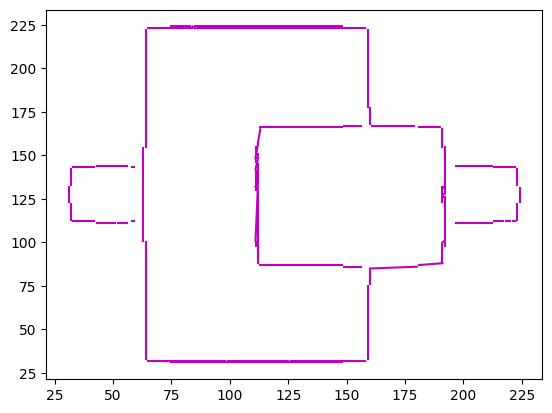

In [119]:
lines = probabilistic_hough_line(edges, threshold=1, line_length=1, line_gap=0)
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'm-')

In [120]:
import numpy as np
from sklearn.cluster import DBSCAN
from collections import defaultdict
from math import atan2, hypot

# Calculate angle and length of each line, store essential data in line_data
line_data = []
for (p0, p1) in lines:
    dx, dy = p1[0] - p0[0], p1[1] - p0[1]
    angle = atan2(dy, dx)
    length = hypot(dy, dx)  # More efficient calculation of hypotenuse
    line_data.append([p0[0], p0[1], p1[0], p1[1], angle, length])

# Optionally filter out lines shorter than a minimum length (e.g., 10 units)
min_length = 1
filtered_data = [line for line in line_data if line[5] > min_length]

# Cluster the remaining line data based on the angle using DBSCAN
angles = np.array([line[4] for line in filtered_data]).reshape(-1, 1)
clustering = DBSCAN(eps=1, min_samples=1).fit(angles)
labels = clustering.labels_

# Group lines by their cluster label, excluding any outliers
grouped_lines = defaultdict(list)
for label, line in zip(labels, filtered_data):
    if label != -1:
        grouped_lines[label].append(line)

# Output the labels to understand the clustering
print("Cluster labels:", labels)
print("Number of groups:", len(grouped_lines))

# Optionally return or process grouped_lines further
#return grouped_lines
grouped_lines

for label, lines in grouped_lines.items():
    print(f"Cluster {label}:")
    for line in lines:
        print(f"  Start: ({line[0]}, {line[1]}), End: ({line[2]}, {line[3]}), Angle: {line[4]}, Length: {line[5]}")
    print("")  # Prints a newline for better separation between clusters

Cluster labels: [0 1 0 1 1 0 1 1 0 1 0 1 1 1 1 0 1 0 0 1 0 1 1 0 0 1 0 0 0 1 0 0 1 1 1 1 1
 1 1 1 1 1 0 0 1 1 1 1 1 0 0 1 0 1 1 0 0 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1
 1]
Number of groups: 2
Cluster 0:
  Start: (148, 31), End: (75, 31), Angle: 3.141592653589793, Length: 73.0
  Start: (158, 32), End: (126, 32), Angle: 3.141592653589793, Length: 32.0
  Start: (179, 167), End: (161, 167), Angle: 3.141592653589793, Length: 18.0
  Start: (105, 32), End: (99, 32), Angle: 3.141592653589793, Length: 6.0
  Start: (158, 223), End: (90, 223), Angle: 3.141592653589793, Length: 68.0
  Start: (42, 112), End: (33, 112), Angle: 3.141592653589793, Length: 9.0
  Start: (212, 111), End: (197, 111), Angle: 3.141592653589793, Length: 15.0
  Start: (84, 223), End: (65, 223), Angle: 3.141592653589793, Length: 19.0
  Start: (148, 224), End: (90, 224), Angle: 3.141592653589793, Length: 58.0
  Start: (148, 166), End: (131, 166), Angle: 3.141592653589793, Length: 17.0
  Start: (112, 32), End: (106, 32), Angle: 3.

In [121]:
from shapely.geometry import Polygon

polygons = []
for lines in grouped_lines.values():
    points = []
    for line in lines:
        points.extend([(line[0], line[1]), (line[2], line[3])])  # Adding both points at once

    unique_points = list(dict.fromkeys(points))
    if len(unique_points) >= 3:
        poly = Polygon(unique_points)
        if poly.is_valid and poly.area > 0:
            polygons.append(poly)
        else:
            print(f"Invalid or zero-area polygon skipped: {unique_points}")
    else:
        print(f"Not enough unique points to form a polygon: {unique_points}")

coordinates = []
for poly in polygons:
    x, y = poly.exterior.coords.xy
    coordinates.append(list(zip(x, y)))  # Pairing x and y coordinates

polygons

Invalid or zero-area polygon skipped: [(148, 31), (75, 31), (158, 32), (126, 32), (179, 167), (161, 167), (105, 32), (99, 32), (158, 223), (90, 223), (42, 112), (33, 112), (212, 111), (197, 111), (84, 223), (65, 223), (148, 224), (90, 224), (148, 166), (131, 166), (112, 32), (106, 32), (125, 32), (113, 32), (190, 166), (181, 166), (130, 166), (113, 166), (42, 143), (33, 143), (88, 223), (86, 223), (56, 111), (52, 111), (83, 224), (75, 224), (98, 32), (65, 32), (212, 144), (197, 144), (217, 112), (213, 112), (51, 111), (43, 111), (156, 167), (151, 167), (222, 143), (213, 143), (156, 86), (149, 86)]
Invalid or zero-area polygon skipped: [(218, 112), (220, 112), (112, 133), (111, 132), (64, 69), (64, 33), (63, 154), (63, 101), (64, 100), (64, 70), (159, 222), (159, 178), (112, 149), (111, 148), (191, 88), (181, 87), (159, 75), (159, 33), (84, 224), (85, 223), (112, 156), (111, 149), (64, 159), (64, 155), (64, 222), (64, 170), (112, 148), (111, 142), (180, 86), (160, 85), (112, 132), (111,

[]

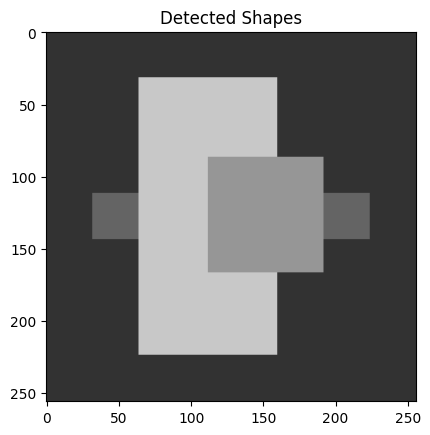

In [122]:
plt.imshow(image, cmap='gray')
for shape in shapes:
    plt.plot([p[0] for p in polygons], [p[1] for p in polygons], 'm-')
plt.title('Detected Shapes')
plt.show()

 #### Ver 2 - No Result & Convert shape Data Cortege

[0 1 1 2 1 1 1 1 1 0 1 2 2 2 2 1 1 2 0 2 3 2 1 0 0 1]


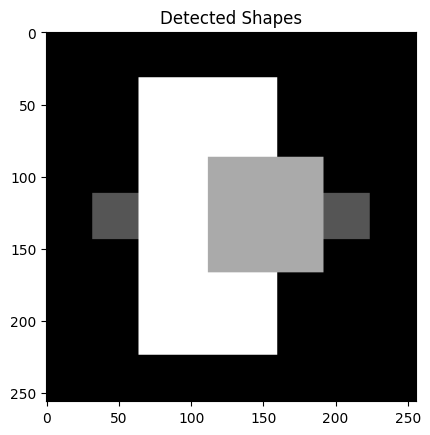

In [124]:
# Load and preprocess the image
image = imread('./Lab4/imgs-P4/cuadros.png')
image_gray = rgb2gray(image)
edges = canny(image_gray, sigma=2.5)


# Detect lines
#lines = probabilistic_hough_line(edges, threshold=10, line_length=5, line_gap=2)
lines = probabilistic_hough_line(edges, threshold=20, line_length=10, line_gap=5)

# Group lines and form shapes
asd = group_linesw(lines)
qwe = form_shapesw(asd)

# Display the results
display_shapes(image_gray, qwe)


##### Convert shape Data Cortege

In [125]:
shape_data = [0, 0, 0, 1, 1, 2, 1, 0, 0, 1, 1, 0, 1, 1, 0, 2, 1, 2, 0, 1, 0, 2, 0, 1, 2, 1, 2, 1, 0]

# Проверка на четность количества элементов
if len(shape_data) % 2 != 0:
    print("Warning: The number of elements in 'shape' should be even. The last element will be ignored.")

# Переформатирование списка в список пар координат
coordinates = list(zip(shape_data[::2], shape_data[1::2]))  # Берем элементы с шагом 2

# Добавляем первую точку в конец для замыкания фигуры
if coordinates:
    coordinates.append(coordinates[0])

# Теперь coordinates содержит пары (x, y) и готов к использованию в plt.plot()




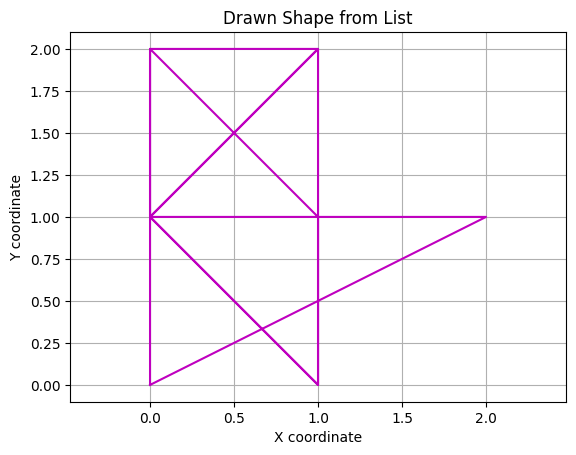

In [126]:
# Рисуем фигуру
plt.figure()
plt.plot([p[0] for p in coordinates], [p[1] for p in coordinates], 'm-')  # 'm-' для малиновой линии
plt.title("Drawn Shape from List")
plt.xlabel("X coordinate")
plt.ylabel("Y coordinate")
plt.grid(True)
plt.axis('equal')  # Для одинакового масштабирования осей X и Y
plt.show()


#### Ver 4 Not Bad Result Small Code

Angle: -90.00 degrees
  Line from (63, 210) to (63, 45)
  Line from (112, 164) to (111, 109)
  Line from (112, 136) to (112, 89)
  Line from (160, 210) to (160, 168)
  Line from (160, 85) to (160, 45)
  Line from (192, 132) to (192, 99)
  Line from (192, 154) to (191, 125)

Angle: 180.00 degrees
  Line from (157, 223) to (66, 223)
  Line from (157, 32) to (66, 32)
  Line from (155, 167) to (125, 167)
  Line from (146, 166) to (114, 166)

Angle: -1.40 degrees
  Line from (114, 87) to (155, 86)
  Line from (161, 168) to (190, 165)



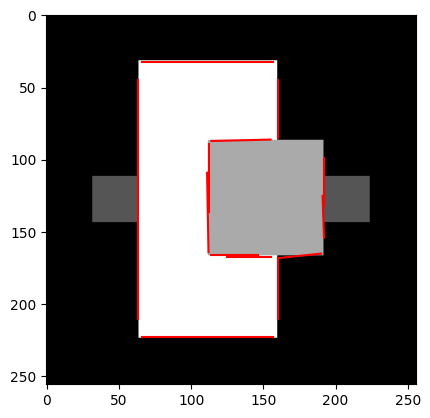

In [127]:
# @title
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.feature import canny
from skimage.transform import probabilistic_hough_line
from collections import defaultdict

def group_lines(lines):
    line_data = []
    for (p0, p1) in lines:
        angle = np.arctan2(p1[1] - p0[1], p1[0] - p0[0])
        line_data.append([(p0, p1), angle])

    # Кластеризация по углу с использованием простого порога
    angle_threshold = 0.2  # Разница в радианах
    grouped_lines = defaultdict(list)
    for data, angle in line_data:
        found = False
        for key in list(grouped_lines.keys()):
            if np.abs(angle - key) < angle_threshold:
                grouped_lines[key].append(data)
                found = True
                break
        if not found:
            grouped_lines[angle].append(data)

    return grouped_lines

# Загрузка и предобработка изображения

image = imread('./Lab4/imgs-P4/cuadros.png')
image_gray = rgb2gray(image)
edges = canny(image_gray, sigma=3)

# Обнаружение линий
lines = probabilistic_hough_line(edges, threshold=10, line_length=25, line_gap=3)

# Группирование линий
grouped_lines = group_lines(lines)

# Вывод группированных линий
for angle, group in grouped_lines.items():
    print(f"Angle: {np.degrees(angle):.2f} degrees")
    for line in group:
        p0, p1 = line  # Каждая line состоит из двух точек p0 и p1
        print(f"  Line from {p0} to {p1}")
    print()

# Опционально: визуализация результатов
plt.imshow(image_gray, cmap='gray')
for group in grouped_lines.values():
    for (p0, p1) in group:
        plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'r')
plt.show()


###  Detected the actual segments

#### Fin Design Ver1 Light

Angle: -90.00 degrees
  Line from (160, 87) to (160, 31)
  Line from (64, 210) to (63, 97)
  Line from (63, 96) to (63, 31)
  Line from (160, 224) to (160, 166)
  Line from (159, 224) to (159, 168)
  Line from (63, 224) to (63, 154)
  Line from (64, 153) to (64, 31)
  Line from (159, 85) to (159, 31)
  Line from (111, 133) to (112, 86)
  Line from (192, 162) to (191, 106)
  Line from (192, 134) to (192, 94)
  Line from (191, 165) to (191, 135)
  Line from (111, 165) to (111, 134)
  Line from (112, 153) to (112, 125)
  Line from (223, 143) to (223, 112)
  Line from (32, 142) to (32, 113)
  Line from (224, 142) to (224, 115)
  Line from (31, 140) to (31, 113)

Angle: -179.28 degrees
  Line from (191, 167) to (111, 166)

Angle: -0.80 degrees
  Line from (111, 87) to (183, 86)

Angle: 180.00 degrees
  Line from (192, 166) to (142, 166)
  Line from (192, 87) to (127, 87)
  Line from (158, 223) to (64, 223)
  Line from (158, 32) to (65, 32)
  Line from (158, 31) to (65, 31)
  Line from (223,

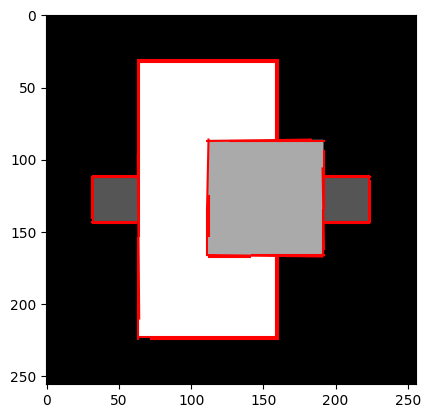

In [134]:

lines = probabilistic_hough_line(binary_edge_map, threshold=10, line_length=25, line_gap=3)

# Группирование линий
grouped_lines = group_lines(lines)

# Вывод группированных линий
for angle, group in grouped_lines.items():
    print(f"Angle: {np.degrees(angle):.2f} degrees")
    for line in group:
        p0, p1 = line  # Каждая line состоит из двух точек p0 и p1
        print(f"  Line from {p0} to {p1}")
    print()

# Опционально: визуализация результатов
plt.imshow(image_gray, cmap='gray')
for group in grouped_lines.values():
    for (p0, p1) in group:
        plt.plot((p0[0], p1[0]), (p0[1], p1[1]), 'r')
plt.show()


#### Fin Design Ver2 Long

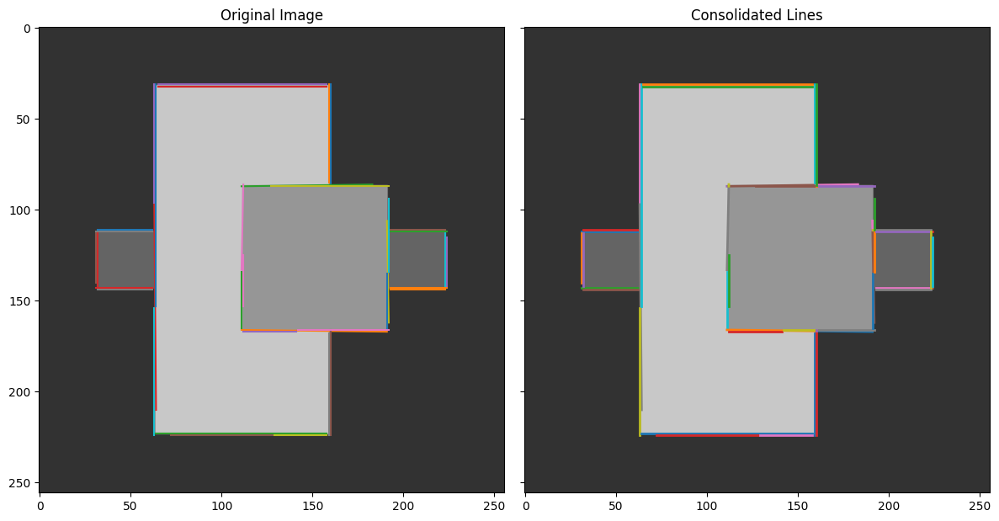

In [135]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import probabilistic_hough_line
from shapely.geometry import LineString, MultiLineString
from shapely.ops import linemerge, unary_union

# Example: Generate an image with edges (this should be replaced by your actual edges input)
from skimage.data import binary_blobs
from skimage.filters import sobel

#image = binary_blobs(length=200, seed=1)
#edges = sobel(image)

# Probabilistic Hough Transform
#lines = probabilistic_hough_line(edges, threshold=10, line_length=10, line_gap=3)

# Convert list of lines to Shapely LineString objects
line_strings = [LineString(line) for line in lines]

# Create a MultiLineString object
multi_line = MultiLineString(line_strings)

# Merge lines that are within a certain distance of each other
merged_lines = linemerge(multi_line)

# If lines are just touching or very close, we use unary_union to merge them
consolidated_lines = unary_union(merged_lines)

# Plotting the results
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Original Image')
for line in lines:
    p0, p1 = line
    ax[0].plot((p0[0], p1[0]), (p0[1], p1[1]))

ax[1].imshow(image, cmap=plt.cm.gray)
ax[1].set_title('Consolidated Lines')
for line in consolidated_lines.geoms:
    x, y = line.xy
    ax[1].plot(x, y, linewidth=2)

plt.tight_layout()
plt.show()

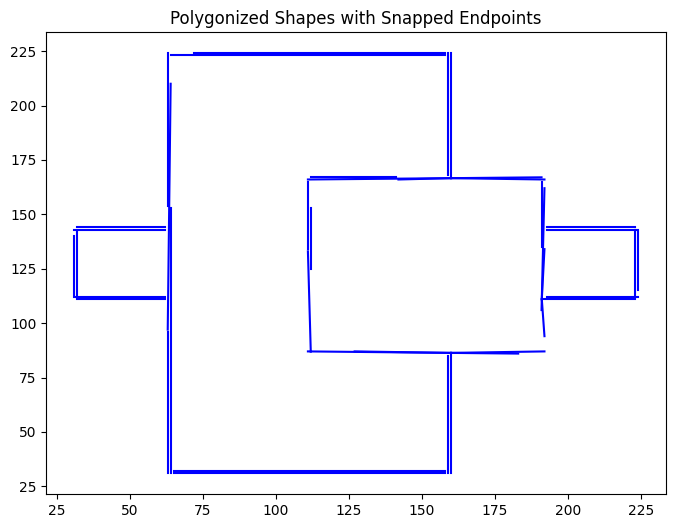

In [137]:
import matplotlib.pyplot as plt
from shapely.geometry import LineString, MultiLineString, Point
from shapely.ops import linemerge, unary_union, polygonize, snap

# Function to snap line endpoints close to other line endpoints
def snap_lines(lines, snap_threshold):
    snapped_lines = list(lines)  # Make a mutable copy of the line list
    for i in range(len(snapped_lines)):
        for j in range(i + 1, len(snapped_lines)):
            if snapped_lines[i].distance(snapped_lines[j]) < snap_threshold:
                # Modify line j to start or end at the closest endpoint of line i
                line1, line2 = snapped_lines[i], snapped_lines[j]
                if Point(line2.coords[0]).distance(Point(line1.coords[-1])) < snap_threshold:
                    snapped_lines[j] = LineString([line1.coords[-1], line2.coords[1]])
                elif Point(line2.coords[-1]).distance(Point(line1.coords[0])) < snap_threshold:
                    snapped_lines[j] = LineString([line2.coords[0], line1.coords[0]])
    return snapped_lines

# Assuming 'consolidated_lines' is your MultiLineString from previous code blocks
# Ensure it's a MultiLineString; if not, create it from line segments:
if not isinstance(consolidated_lines, MultiLineString):
    consolidated_lines = MultiLineString([LineString(line) for line in line_segments])

# Snap line endpoints that are within 5 pixels of each other
snap_threshold = 1
snapped_lines = snap_lines(consolidated_lines.geoms, snap_threshold)  # Corrected to use .geoms

# Use unary_union to merge lines that touch or overlap, simplifying the connection process
unified_lines = unary_union(MultiLineString(snapped_lines))

# Polygonize: this function tries to form polygons from connected lines
polygons = list(polygonize(unified_lines))

# Plotting the results
fig, ax = plt.subplots(figsize=(8, 6))
for poly in polygons:
    x, y = poly.exterior.xy
    ax.fill(x, y, alpha=0.5, fc='r', edgecolor='black')  # Red fill with black border

# Add lines over the polygons to highlight the edges
for line in unified_lines.geoms:
    x, y = line.xy
    ax.plot(x, y, color='blue', linewidth=1.5)

ax.set_title('Polygonized Shapes with Snapped Endpoints')
plt.show()